# 시각화프로젝트 
- 제목 : 서울시 상권분석 시각화 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from selenium import webdriver
from bs4 import BeautifulSoup
import pandas as pd

In [2]:
# 한글 폰트 
import matplotlib
from matplotlib import font_manager, rc
import platform
if platform.system()=="Windows":
    font_name=font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
matplotlib.rcParams['axes.unicode_minus']=False

import warnings
warnings.filterwarnings("ignore")

In [3]:
# plotly  사진 저장하기 위한 패키지 설치

#!pip install -U kaleido
#!pip install -U plotly
import plotly.io as pio

pio.orca.config.executable = '/path/to/orca'

In [4]:
#!pip install chart-studio

In [5]:
# 차트스트디오에서 PPT 이용시 필요한 라이브러리 및  USERNAME, API

import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls
username = "Bluechip"
api_key = "OCAVgRKe3S9pXSPd3QBu"
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)

In [165]:
#컬럼이 많을 경우 다 보이게 
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

# 데이터셋 

## [파일] 사업체 종사자 밀도(동별)

In [6]:
#2021 종사자 수

se_cop = pd.read_csv("vis_project/사업체+및+종사자+밀도(동별)_20231004104908.csv", header=1)
se_cop

,동별(1),동별(2),동별(3),사업체수 (개),종사자수 (명),평균종사자 (명),사업체밀도 (null),종사자밀도(A) (명/㎢),인구밀도(B),종사자밀도비(A/B*100)
0,합계,소계,소계,1188091,5771226,4.86,1963.00,9535.37,16086.12,59.28
1,합계,종로구,소계,48361,275063,5.69,2022.38,11502.69,6431.21,178.86
2,합계,종로구,사직동,5035,56013,11.12,4093.50,45539.02,7834.15,581.29
3,합계,종로구,삼청동,956,4978,5.21,641.61,3340.94,1838.26,181.75
4,합계,종로구,부암동,894,3762,4.21,393.83,1657.27,4309.25,38.46
...,...,...,...,...,...,...,...,...,...,...
447,합계,강동구,천호2동,4863,14840,3.05,3097.45,9452.23,21498.73,43.97
448,합계,강동구,길동,5966,23814,3.99,2749.31,10974.19,21185.71,51.80
449,합계,강동구,강일동,1443,5960,4.13,638.50,2637.17,14593.81,18.07
450,합계,강동구,상일1동,1679,7035,4.19,633.58,2654.72,14690.19,18.07


## [파일] 사업자 종사자 수 종사자 밀도(동별)

In [7]:
se_cop_pop = pd.read_csv("vis_project/대표자+연령대별+사업체+현황(동별)_20231004104810.csv", header=3)
se_cop_pop

,동별(1),동별(2),동별(3),사업체수 (개),종사자수 (명),사업체수 (개).1,종사자수 (명).1,사업체수 (개).2,종사자수 (명).2,사업체수 (개).3,종사자수 (명).3,사업체수 (개).4,종사자수 (명).4,사업체수 (개).5,종사자수 (명).5
0,합계,소계,소계,1188091,5771226,51939,104941,188024,528716,310065,1223769,348968,2253052,289095,1660748
1,합계,종로구,소계,48361,275063,1609,3490,6390,16033,11825,50952,15090,107515,13447,97073
2,합계,종로구,사직동,5035,56013,194,632,678,2301,1277,10452,1613,19374,1273,23254
3,합계,종로구,삼청동,956,4978,25,40,196,572,240,903,252,1247,243,2216
4,합계,종로구,부암동,894,3762,33,56,139,240,232,576,261,924,229,1966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,합계,강동구,천호2동,4863,14840,188,320,821,1542,1281,3823,1446,5803,1127,3352
448,합계,강동구,길동,5966,23814,228,372,788,1723,1389,4628,1701,7979,1860,9112
449,합계,강동구,강일동,1443,5960,50,101,260,656,368,916,384,1957,381,2330
450,합계,강동구,상일1동,1679,7035,71,88,296,638,448,995,468,2101,396,3213


In [8]:
# 새로운 컬럼명 리스트
new_columns = [
    "합계",
    "구별",
    "동별",
    "사업체수",
    "종수자수",
    "20대 사업체수",
    "20대",
    "30대 사업체수",
    "30대",
    "40대 사업체수",
    "40대",
    "50대 사업체수",
    "50대",
    "60대이상 사업체수",
    "60대이상"
]

se_cop_pop.columns = new_columns
se_cop_pop

,합계,구별,동별,사업체수,종수자수,20대 사업체수,20대,30대 사업체수,30대,40대 사업체수,40대,50대 사업체수,50대,60대이상 사업체수,60대이상
0,합계,소계,소계,1188091,5771226,51939,104941,188024,528716,310065,1223769,348968,2253052,289095,1660748
1,합계,종로구,소계,48361,275063,1609,3490,6390,16033,11825,50952,15090,107515,13447,97073
2,합계,종로구,사직동,5035,56013,194,632,678,2301,1277,10452,1613,19374,1273,23254
3,합계,종로구,삼청동,956,4978,25,40,196,572,240,903,252,1247,243,2216
4,합계,종로구,부암동,894,3762,33,56,139,240,232,576,261,924,229,1966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,합계,강동구,천호2동,4863,14840,188,320,821,1542,1281,3823,1446,5803,1127,3352
448,합계,강동구,길동,5966,23814,228,372,788,1723,1389,4628,1701,7979,1860,9112
449,합계,강동구,강일동,1443,5960,50,101,260,656,368,916,384,1957,381,2330
450,합계,강동구,상일1동,1679,7035,71,88,296,638,448,995,468,2101,396,3213


In [9]:
#필요한 열만 가져오기
se_cop_pop = se_cop_pop[["구별", "동별", "20대", "30대", "40대", "50대", "60대이상"]]

## 파일합치기 (사업체+및+종사자+밀도(동별) + 대표자+연령대별+사업체+현황(동별))

In [10]:
#파일 합치기 
se_cop_merge = pd.concat([se_cop, se_cop_pop], axis=1 )
se_cop_merge

,동별(1),동별(2),동별(3),사업체수 (개),종사자수 (명),평균종사자 (명),사업체밀도 (null),종사자밀도(A) (명/㎢),인구밀도(B),종사자밀도비(A/B*100),구별,동별,20대,30대,40대,50대,60대이상
0,합계,소계,소계,1188091,5771226,4.86,1963.00,9535.37,16086.12,59.28,소계,소계,104941,528716,1223769,2253052,1660748
1,합계,종로구,소계,48361,275063,5.69,2022.38,11502.69,6431.21,178.86,종로구,소계,3490,16033,50952,107515,97073
2,합계,종로구,사직동,5035,56013,11.12,4093.50,45539.02,7834.15,581.29,종로구,사직동,632,2301,10452,19374,23254
3,합계,종로구,삼청동,956,4978,5.21,641.61,3340.94,1838.26,181.75,종로구,삼청동,40,572,903,1247,2216
4,합계,종로구,부암동,894,3762,4.21,393.83,1657.27,4309.25,38.46,종로구,부암동,56,240,576,924,1966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,합계,강동구,천호2동,4863,14840,3.05,3097.45,9452.23,21498.73,43.97,강동구,천호2동,320,1542,3823,5803,3352
448,합계,강동구,길동,5966,23814,3.99,2749.31,10974.19,21185.71,51.80,강동구,길동,372,1723,4628,7979,9112
449,합계,강동구,강일동,1443,5960,4.13,638.50,2637.17,14593.81,18.07,강동구,강일동,101,656,916,1957,2330
450,합계,강동구,상일1동,1679,7035,4.19,633.58,2654.72,14690.19,18.07,강동구,상일1동,88,638,995,2101,3213


In [11]:
se_cop_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452 entries, 0 to 451
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   동별(1)            452 non-null    object 
 1   동별(2)            452 non-null    object 
 2   동별(3)            452 non-null    object 
 3   사업체수 (개)         452 non-null    int64  
 4   종사자수 (명)         452 non-null    int64  
 5   평균종사자 (명)        452 non-null    float64
 6   사업체밀도 (null)     452 non-null    float64
 7   종사자밀도(A) (명/㎢)   452 non-null    float64
 8   인구밀도(B)          452 non-null    float64
 9   종사자밀도비(A/B*100)  452 non-null    float64
 10  구별               452 non-null    object 
 11  동별               452 non-null    object 
 12  20대              452 non-null    int64  
 13  30대              452 non-null    int64  
 14  40대              452 non-null    int64  
 15  50대              452 non-null    int64  
 16  60대이상            452 non-null    int64  
dtypes: float64(5), i

<Axes: >

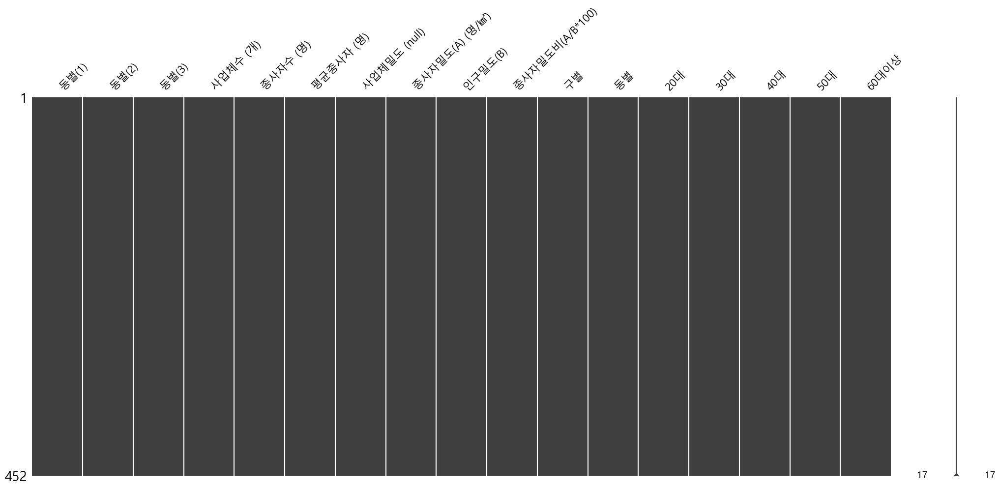

In [12]:
#!pip install missingno
import missingno
missingno.matrix(se_cop_merge)

In [13]:
# 새로운 이름지정
new_columns = [
    "합계",
    "구별",
    "동별",
    "사업체수",
    "종사자수",
    "평균종사자수",
    "사업체밀도",
    "종사자밀도",
    "인구밀도",
    "종사자밀도비",
    "구별1",
    "동별1",
    "20대",
    "30대",
    "40대",
    "50대",
    "60대이상"
]

se_cop_merge.columns = new_columns
se_cop_merge

,합계,구별,동별,사업체수,종사자수,평균종사자수,사업체밀도,종사자밀도,인구밀도,종사자밀도비,구별1,동별1,20대,30대,40대,50대,60대이상
0,합계,소계,소계,1188091,5771226,4.86,1963.00,9535.37,16086.12,59.28,소계,소계,104941,528716,1223769,2253052,1660748
1,합계,종로구,소계,48361,275063,5.69,2022.38,11502.69,6431.21,178.86,종로구,소계,3490,16033,50952,107515,97073
2,합계,종로구,사직동,5035,56013,11.12,4093.50,45539.02,7834.15,581.29,종로구,사직동,632,2301,10452,19374,23254
3,합계,종로구,삼청동,956,4978,5.21,641.61,3340.94,1838.26,181.75,종로구,삼청동,40,572,903,1247,2216
4,합계,종로구,부암동,894,3762,4.21,393.83,1657.27,4309.25,38.46,종로구,부암동,56,240,576,924,1966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,합계,강동구,천호2동,4863,14840,3.05,3097.45,9452.23,21498.73,43.97,강동구,천호2동,320,1542,3823,5803,3352
448,합계,강동구,길동,5966,23814,3.99,2749.31,10974.19,21185.71,51.80,강동구,길동,372,1723,4628,7979,9112
449,합계,강동구,강일동,1443,5960,4.13,638.50,2637.17,14593.81,18.07,강동구,강일동,101,656,916,1957,2330
450,합계,강동구,상일1동,1679,7035,4.19,633.58,2654.72,14690.19,18.07,강동구,상일1동,88,638,995,2101,3213


In [14]:
# 중복컬럼삭제
se_cop_merge = se_cop_merge.drop(['합계', '구별1', '동별1'], axis=1)
se_cop_merge

,구별,동별,사업체수,종사자수,평균종사자수,사업체밀도,종사자밀도,인구밀도,종사자밀도비,20대,30대,40대,50대,60대이상
0,소계,소계,1188091,5771226,4.86,1963.00,9535.37,16086.12,59.28,104941,528716,1223769,2253052,1660748
1,종로구,소계,48361,275063,5.69,2022.38,11502.69,6431.21,178.86,3490,16033,50952,107515,97073
2,종로구,사직동,5035,56013,11.12,4093.50,45539.02,7834.15,581.29,632,2301,10452,19374,23254
3,종로구,삼청동,956,4978,5.21,641.61,3340.94,1838.26,181.75,40,572,903,1247,2216
4,종로구,부암동,894,3762,4.21,393.83,1657.27,4309.25,38.46,56,240,576,924,1966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,강동구,천호2동,4863,14840,3.05,3097.45,9452.23,21498.73,43.97,320,1542,3823,5803,3352
448,강동구,길동,5966,23814,3.99,2749.31,10974.19,21185.71,51.80,372,1723,4628,7979,9112
449,강동구,강일동,1443,5960,4.13,638.50,2637.17,14593.81,18.07,101,656,916,1957,2330
450,강동구,상일1동,1679,7035,4.19,633.58,2654.72,14690.19,18.07,88,638,995,2101,3213


In [15]:
# 구별 통합 합계 데이터  
se_cop_total = se_cop_merge[se_cop_merge['동별'] == '소계']
se_cop_total = se_cop_total[1:] # 합계 제외
se_cop_total.reset_index(drop=True).tail()

,구별,동별,사업체수,종사자수,평균종사자수,사업체밀도,종사자밀도,인구밀도,종사자밀도비,20대,30대,40대,50대,60대이상
20,관악구,소계,37915,128417,3.39,1282.28,4343.06,16891.36,25.71,4008,13445,25813,42295,42856
21,서초구,소계,71958,487976,6.78,1531.62,10386.53,8858.08,117.25,5652,35885,103565,191636,151238
22,강남구,소계,110007,801419,7.29,2785.16,20290.37,13616.05,149.02,13506,86141,199189,286060,216523
23,송파구,소계,74531,400781,5.38,2200.04,11830.46,19599.25,60.36,5938,35106,81406,141860,136471
24,강동구,소계,41660,157465,3.78,1694.15,6403.49,18969.61,33.76,2861,13861,31151,54488,55104


In [16]:
se_cop_total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25 entries, 1 to 432
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   구별      25 non-null     object 
 1   동별      25 non-null     object 
 2   사업체수    25 non-null     int64  
 3   종사자수    25 non-null     int64  
 4   평균종사자수  25 non-null     float64
 5   사업체밀도   25 non-null     float64
 6   종사자밀도   25 non-null     float64
 7   인구밀도    25 non-null     float64
 8   종사자밀도비  25 non-null     float64
 9   20대     25 non-null     int64  
 10  30대     25 non-null     int64  
 11  40대     25 non-null     int64  
 12  50대     25 non-null     int64  
 13  60대이상   25 non-null     int64  
dtypes: float64(5), int64(7), object(2)
memory usage: 2.9+ KB


In [17]:
# 구별, 동별 데이터를 따로 저장해서 진행
se_cop_merge1 = se_cop_merge[se_cop_merge['동별'] != '소계']
se_cop_merge1.reset_index(drop=True)

,구별,동별,사업체수,종사자수,평균종사자수,사업체밀도,종사자밀도,인구밀도,종사자밀도비,20대,30대,40대,50대,60대이상
0,종로구,사직동,5035,56013,11.12,4093.50,45539.02,7834.15,581.29,632,2301,10452,19374,23254
1,종로구,삼청동,956,4978,5.21,641.61,3340.94,1838.26,181.75,40,572,903,1247,2216
2,종로구,부암동,894,3762,4.21,393.83,1657.27,4309.25,38.46,56,240,576,924,1966
3,종로구,평창동,1321,4321,3.27,148.93,487.15,2066.40,23.57,124,288,1053,1091,1765
4,종로구,무악동,761,1891,2.48,2113.89,5252.78,23047.22,22.79,23,134,272,403,1059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421,강동구,천호2동,4863,14840,3.05,3097.45,9452.23,21498.73,43.97,320,1542,3823,5803,3352
422,강동구,길동,5966,23814,3.99,2749.31,10974.19,21185.71,51.80,372,1723,4628,7979,9112
423,강동구,강일동,1443,5960,4.13,638.50,2637.17,14593.81,18.07,101,656,916,1957,2330
424,강동구,상일1동,1679,7035,4.19,633.58,2654.72,14690.19,18.07,88,638,995,2101,3213


In [18]:
se_cop_merge1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 2 to 451
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   구별      426 non-null    object 
 1   동별      426 non-null    object 
 2   사업체수    426 non-null    int64  
 3   종사자수    426 non-null    int64  
 4   평균종사자수  426 non-null    float64
 5   사업체밀도   426 non-null    float64
 6   종사자밀도   426 non-null    float64
 7   인구밀도    426 non-null    float64
 8   종사자밀도비  426 non-null    float64
 9   20대     426 non-null    int64  
 10  30대     426 non-null    int64  
 11  40대     426 non-null    int64  
 12  50대     426 non-null    int64  
 13  60대이상   426 non-null    int64  
dtypes: float64(5), int64(7), object(2)
memory usage: 49.9+ KB


In [19]:
se_cop_merge1.sort_values(by=('사업체수'), ascending=False)

,구별,동별,사업체수,종사자수,평균종사자수,사업체밀도,종사자밀도,인구밀도,종사자밀도비,20대,30대,40대,50대,60대이상
295,금천구,가산동,25043,182376,7.28,9937.70,72371.43,10388.49,696.65,2545,14878,54129,73044,37780
389,강남구,역삼1동,22326,176153,7.89,9500.43,74958.72,15570.21,481.42,3961,21391,41401,64651,44749
9,종로구,종로1.2.3.4가동,17286,107067,6.19,7355.74,45560.43,3657.45,1245.69,1131,4924,20571,48042,32399
306,영등포구,여의동,15940,192014,12.05,1897.62,22858.81,3978.57,574.55,2297,19359,28818,89745,51795
321,영등포구,영등포동,14943,41886,2.80,11859.52,33242.86,23730.95,140.08,758,3481,8857,15045,13745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,종로구,창신3동,439,1128,2.57,1908.70,4904.35,29273.91,16.75,36,113,188,509,282
368,서초구,반포본동,374,1286,3.44,370.30,1273.27,1980.20,64.30,13,43,155,590,485
427,송파구,잠실7동,335,1259,3.76,558.33,2098.33,15940.00,13.16,19,56,154,469,561
393,강남구,개포1동,279,1251,4.48,219.69,985.04,5109.45,19.28,16,59,464,488,224


### [그래프] 구별 사업체 수

In [20]:
#! pip install -U kaleido

In [22]:
import plotly.express as px

df=se_cop_merge1.sort_values(by='사업체수', ascending=False)

fig = px.bar(df, x='구별', y='사업체수', title='구별 사업체 수')
# 그래프 배경색과 글자색 설정
fig.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',      # 글자색을 흰색으로 설정
    #xaxis_gridcolor='gray', # x 축 줄눈 색상을 그레이로 설정
    #yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)


# y축 범례에 숫자 형식 지정
fig.update_layout(
    yaxis_tickformat=',d'  # 천 단위 구분 기호와 숫자로 형식 지정
)


# 그래프 표시
fig.show()

# 이미지 저장
#pio.write_image(fig, '사업체수_막대그래프.png')

### [그래프] 인구밀도 및 사업체 밀도

In [23]:
fig = px.scatter(se_cop_total, x='인구밀도', y='사업체밀도', color='구별', title='인구 밀도 vs. 사업체 밀도')

# 그래프 배경색과 글자색 설정
fig.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    xaxis_gridcolor='gray', # x 축 줄눈 색상을 그레이로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# x축 범례에 숫자 형식 지정
fig.update_layout(
    xaxis_tickformat='d'  # 천 단위 구분 기호와 숫자로 형식 지정
)

fig.show()


# 이미지 저장
#pio.write_image(fig, '인구밀도 및 사업체 밀도.png')

py.plot(fig, filename="'주인구밀도 및 사업체 밀도.png'", auto_open=True) 



'https://plotly.com/~Bluechip/30/'

### [그래프] 구별 종사자 연령분포

In [24]:
fig = px.scatter(se_cop_total, x='구별', y=['20대', '30대', '40대', '50대', '60대이상'], title='구별 종사자 연령 분포')

# 그래프 배경색과 글자색 설정
fig.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    xaxis_gridcolor='gray', # x 축 줄눈 색상을 그레이로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

fig.show()


# 이미지 저장
#pio.write_image(fig, '구별 종사자 연령 분포.png')

### [그래프] 구별 연령대별 종사자 수 

In [25]:
data_melted = pd.melt(se_cop_total, id_vars=['구별'], var_name='연령대', value_name='종사자 수')
#data_melted = data_melted[data_melted['종사자 수'] != "소계"]

# 선택할 연령대
selected_ages = ['20대', '30대', '40대', '50대', '60대이상']

# 데이터를 '구별' 열을 기준으로 재구성 (구별로 연령대 데이터를 총합)
data_by_district = se_cop_total.groupby('구별')[selected_ages].sum().reset_index()

# 데이터를 값이 큰 순서대로 정렬
data_by_district['합계'] = data_by_district[['20대', '30대', '40대', '50대', '60대이상']].sum(axis=1)
data_by_district = data_by_district.sort_values(by='합계', ascending=False)

# 블럭 차트 생성
fig = px.bar(data_by_district, x='구별', y=selected_ages, title='구별 연령대별 종사자 수',
             labels={'value': '종사자 수', 'variable': '연령대'},
             height=500, width=1000, barmode='relative')

# 그래프 배경색과 글자색 설정
fig.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    #xaxis_gridcolor='gray', # x 축 줄눈 색상을 그레이로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# y축 범례에 숫자 형식 지정
fig.update_layout(
    yaxis_tickformat='d'  # 천 단위 구분 기호와 숫자로 형식 지정
)

fig.show()


# 이미지 저장
#pio.write_image(fig, '구별 연령대 종사자 수.png')

### [그래프] 평균종사자분포

In [26]:
# 히스토그램 생성
fig = px.histogram(se_cop_merge1, x='평균종사자수', title='평균 종사자 수 분포')

# 그래프 배경색과 글자색 설정
fig.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    xaxis_gridcolor='gray', # x 축 줄눈 색상을 그레이로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# y축 범례에 숫자 형식 지정
fig.update_layout(
    yaxis_tickformat='d'  # 천 단위 구분 기호와 숫자로 형식 지정
)

# 5명 이하 종사자 수 비율 계산
total_count = len(se_cop_merge1)  # 전체 데이터 개수
less_than_5_count = len(se_cop_merge1[se_cop_merge1['평균종사자수'] <= 5])  # 5명 이하 종사자 수의 빈도
less_than_5_ratio = less_than_5_count / total_count  # 5명 이하 종사자 수 비율

# 비율 정보를 주석으로 추가
fig.add_annotation(
    text=f'5명 이하 비율: {less_than_5_ratio:.2%}',
    x=7,  # 주석을 표시할 x 좌표 
    y=30,  # 주석을 표시할 y 좌표
    showarrow=False  # 화살표 표시유무
)

fig.show()

# 이미지 저장
#pio.write_image(fig, '구별 연령대 종사자 분포.png')

In [27]:
se_cop_merge1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 2 to 451
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   구별      426 non-null    object 
 1   동별      426 non-null    object 
 2   사업체수    426 non-null    int64  
 3   종사자수    426 non-null    int64  
 4   평균종사자수  426 non-null    float64
 5   사업체밀도   426 non-null    float64
 6   종사자밀도   426 non-null    float64
 7   인구밀도    426 non-null    float64
 8   종사자밀도비  426 non-null    float64
 9   20대     426 non-null    int64  
 10  30대     426 non-null    int64  
 11  40대     426 non-null    int64  
 12  50대     426 non-null    int64  
 13  60대이상   426 non-null    int64  
dtypes: float64(5), int64(7), object(2)
memory usage: 49.9+ KB


### [지도] 종사자수

In [177]:
import folium
import os, json
import pandas as pd
import plotly.express as px

seoul_geo = 'vis_project/hangjeongdong_서울특별시.geojson'

se_cop_merge1['full_name'] = '서울특별시'+' '+se_cop_merge1['구별']+' '+se_cop_merge1['동별']
se_cop_merge1['full_name'] = se_cop_merge1['full_name'].apply(lambda x: x.replace('.','·'))

fig = px.choropleth_mapbox(se_cop_merge1,
                           geojson=seoul_geo,
                           locations='full_name',
                           color='종사자수',
                           color_continuous_scale='viridis', featureidkey = 'properties.adm_nm',
                           mapbox_style='carto-positron',
                           zoom=9.5,
                           center = {"lat": 37.563383, "lon": 126.996039},
                           opacity=0.5,
                          )

fig.show()


In [28]:
# 여의도 , 가산동,  역삼1동 

In [32]:
geo_data= 'https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json'

### [지도] 사업체 인구밀도 / 사업체밀도

In [180]:
import folium
import os, json
import pandas as pd
import plotly.express as px

seoul_geo = 'vis_project/hangjeongdong_서울특별시.geojson'

se_cop_merge1['full_name'] = '서울특별시'+' '+se_cop_merge1['구별']+' '+se_cop_merge1['동별']
se_cop_merge1['full_name'] = se_cop_merge1['full_name'].apply(lambda x: x.replace('.','·'))

fig = px.choropleth_mapbox(se_cop_merge1,
                           geojson=seoul_geo,
                           locations='full_name',
                           color='인구밀도',
                           color_continuous_scale='viridis', featureidkey = 'properties.adm_nm',
                           mapbox_style='carto-positron',
                           zoom=9.5,
                           center = {"lat": 37.563383, "lon": 126.996039},
                           opacity=0.5,
                          )

fig.show()
#py.plot(fig, filename="인구밀도.png", auto_open=True)
py.plot(fig, filename="인구밀도.html", auto_open=True)

'https://plotly.com/~Bluechip/39/'

In [152]:
import os, json
import pandas as pd
import plotly.express as px

seoul_geo = 'vis_project/hangjeongdong_서울특별시.geojson'

se_cop_merge1['full_name'] = '서울특별시'+' '+se_cop_merge1['구별']+' '+se_cop_merge1['동별']
se_cop_merge1['full_name'] = se_cop_merge1['full_name'].apply(lambda x: x.replace('.','·'))

fig = px.choropleth_mapbox(se_cop_merge1,
                           geojson=seoul_geo,
                           locations='full_name',
                           color='사업체밀도',
                           color_continuous_scale='viridis', featureidkey = 'properties.adm_nm',
                           mapbox_style='carto-positron',
                           zoom=9.5,
                           center = {"lat": 37.563383, "lon": 126.996039},
                           opacity=0.5,
                          )

fig.show()

#py.plot(fig, filename="사업체밀도.png", auto_open=True)

In [154]:
#중구
se_cop_jg = se_cop_merge1[se_cop_merge1['구별'] == '중구']
se_cop_jg

import os, json
import pandas as pd
import plotly.express as px

seoul_geo = 'vis_project/hangjeongdong_서울특별시.geojson'

fig = px.choropleth_mapbox(se_cop_jg,
                           geojson=seoul_geo,
                           locations='full_name',
                           color='사업체밀도',
                           color_continuous_scale='viridis', featureidkey = 'properties.adm_nm',
                           mapbox_style='carto-positron',
                           zoom=12,
                           center = {"lat": 37.563383, "lon": 126.996039},
                           opacity=0.5,
                          )

fig.show()

## [파일] 자치구별 상권 상권변화지표 폐업, 개업 비율

In [38]:
#opening and closing 
#2014 1분기 ~ 23년 1분기
store_oac = pd.read_csv("vis_project/서울시 상권분석서비스(자치구별 상권변화지표).csv", encoding='cp949')
store_oac

,기준_년_코드,기준_분기_코드,시군구_코드,시군구_코드_명,상권_변화_지표,상권_변화_지표_명,운영_영업_개월_평균,폐업_영업_개월_평균,서울_운영_영업_개월_평균,서울_폐업_영업_개월_평균
0,2023,1,11740,강동구,LL,다이나믹,98,49,104,52
1,2023,1,11710,송파구,LL,다이나믹,102,49,104,52
2,2023,1,11680,강남구,LL,다이나믹,99,48,104,52
3,2023,1,11650,서초구,HH,정체,114,53,104,52
4,2023,1,11620,관악구,LL,다이나믹,99,49,104,52
...,...,...,...,...,...,...,...,...,...,...
920,2014,1,11215,광진구,LL,다이나믹,89,44,92,45
921,2014,1,11200,성동구,HH,정체,94,48,92,45
922,2014,1,11170,용산구,HH,정체,100,49,92,45
923,2014,1,11140,중구,HH,정체,107,52,92,45


In [39]:
store_oac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 925 entries, 0 to 924
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   기준_년_코드         925 non-null    int64 
 1   기준_분기_코드        925 non-null    int64 
 2   시군구_코드          925 non-null    int64 
 3   시군구_코드_명        925 non-null    object
 4   상권_변화_지표        925 non-null    object
 5   상권_변화_지표_명      925 non-null    object
 6   운영_영업_개월_평균     925 non-null    int64 
 7   폐업_영업_개월_평균     925 non-null    int64 
 8   서울_운영_영업_개월_평균  925 non-null    int64 
 9   서울_폐업_영업_개월_평균  925 non-null    int64 
dtypes: int64(7), object(3)
memory usage: 72.4+ KB


In [40]:
store_oac['년분기'] = store_oac['기준_년_코드'].astype(str) +"."+ store_oac['기준_분기_코드'].astype(str)
#store_oac = store_oac.set_index("년분기")

In [41]:
# 새로운 컬럼생성
store_oac['년분기'] = store_oac['기준_년_코드'].astype(str) +"."+ store_oac['기준_분기_코드'].astype(str)
store_oac["자치구_운영영업평균차이"] = (store_oac['서울_운영_영업_개월_평균'] - store_oac['운영_영업_개월_평균']) #/ pivot_data['운영_영업_개월_평균']
store_oac["자치구_폐업영업평균차이"] = store_oac['서울_폐업_영업_개월_평균'] - store_oac['폐업_영업_개월_평균'] 
store_oac["자치구_운영폐업차이"] = store_oac['운영_영업_개월_평균'] - store_oac['폐업_영업_개월_평균'] 
store_oac

,기준_년_코드,기준_분기_코드,시군구_코드,시군구_코드_명,상권_변화_지표,상권_변화_지표_명,운영_영업_개월_평균,폐업_영업_개월_평균,서울_운영_영업_개월_평균,서울_폐업_영업_개월_평균,년분기,자치구_운영영업평균차이,자치구_폐업영업평균차이,자치구_운영폐업차이
0,2023,1,11740,강동구,LL,다이나믹,98,49,104,52,2023.1,6,3,49
1,2023,1,11710,송파구,LL,다이나믹,102,49,104,52,2023.1,2,3,53
2,2023,1,11680,강남구,LL,다이나믹,99,48,104,52,2023.1,5,4,51
3,2023,1,11650,서초구,HH,정체,114,53,104,52,2023.1,-10,-1,61
4,2023,1,11620,관악구,LL,다이나믹,99,49,104,52,2023.1,5,3,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
920,2014,1,11215,광진구,LL,다이나믹,89,44,92,45,2014.1,3,1,45
921,2014,1,11200,성동구,HH,정체,94,48,92,45,2014.1,-2,-3,46
922,2014,1,11170,용산구,HH,정체,100,49,92,45,2014.1,-8,-4,51
923,2014,1,11140,중구,HH,정체,107,52,92,45,2014.1,-15,-7,55


In [42]:
# 상권_변화_지표_명을 그룹화하고 시군구_코드_명으로 개수를 세기
grouped_data = store_oac.groupby(['상권_변화_지표_명', '시군구_코드_명']).size().reset_index(name='개수')

# 결과를 데이터프레임으로 출력
df_grouped_data = pd.DataFrame(grouped_data)

# 결과 확인
df_grouped_data

,상권_변화_지표_명,시군구_코드_명,개수
0,다이나믹,강남구,37
1,다이나믹,강동구,37
2,다이나믹,강북구,37
3,다이나믹,강서구,37
4,다이나믹,관악구,37
5,다이나믹,광진구,37
6,다이나믹,구로구,27
7,다이나믹,금천구,37
8,다이나믹,노원구,37
9,다이나믹,도봉구,37


In [43]:
import pandas as pd


grouped_data = store_oac.groupby(['시군구_코드_명', '상권_변화_지표_명']).size().reset_index(name='개수')

pivot_table = pd.pivot_table(grouped_data, values='개수', index='시군구_코드_명', columns='상권_변화_지표_명', fill_value=0)
pivot_table.reset_index(inplace=True)

pivot_table.columns.name = None 
pivot_table.rename_axis(columns={'시군구_코드_명': '시군구', '다이나믹': '다이나믹_수', '상권축소': '상권축소_수', '상권확장': '상권확장_수', '정체': '정체_수'}, inplace=True)

pivot_table


,시군구_코드_명,다이나믹,상권축소,상권확장,정체
0,강남구,37,0,0,0
1,강동구,37,0,0,0
2,강북구,37,0,0,0
3,강서구,37,0,0,0
4,관악구,37,0,0,0
5,광진구,37,0,0,0
6,구로구,27,10,0,0
7,금천구,37,0,0,0
8,노원구,37,0,0,0
9,도봉구,37,0,0,0


### [그래프] 운영 영업 개월 평균 vs 폐업 영업 개월 평균 (시군구별, 2014.1Q ~ 2023.1Q 분기별

In [44]:
import plotly.express as px

# 필요한 라이브러리를 임포트합니다.

# 데이터에서 2014년부터 2023년까지의 데이터만 필터링합니다.
filtered_data = store_oac[(store_oac['기준_년_코드'] >= 2014) & (store_oac['기준_년_코드'] <= 2023)]

# 년도별로 시군구 코드명에 따른 운영 영업 개월 평균을 표시하는 막대 그래프
# fig = px.bar(filtered_data, x='기준_년_코드', y='운영_영업_개월_평균', color='시군구_코드_명',
#              title='년도별 운영 영업 개월 평균 (시군구별, 2020년부터 2023년까지)',
#              labels={'운영_영업_개월_평균': '운영 영업 개월 평균'},
#              template='plotly_dark')
# fig.update_layout(xaxis_title='년도', xaxis_type='category')
# fig.show()

# 년도별로 시군구 코드명에 따른 운영 영업 개월 평균과 폐업 영업 개월 평균의 관계를 나타내는 산점도
fig = px.scatter(filtered_data, x='운영_영업_개월_평균', y='폐업_영업_개월_평균', color='시군구_코드_명',
                 title='운영 영업 개월 평균 vs 폐업 영업 개월 평균 (시군구별, 2014.1Q ~ 2023.1Q 분기별)',
                 labels={'운영_영업_개월_평균': '운영 영업 개월 평균', '폐업_영업_개월_평균': '폐업 영업 개월 평균'},
                 template='plotly_dark')



# 그래프 배경색과 글자색 설정
fig.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    #xaxis_gridcolor='gray', # x 축 줄눈 색상을 그레이로 설정
    #yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)


fig.show()


# 이미지 저장
#pio.write_image(fig, '구별_운영 영업 개월 평균 vs 폐업 영업 개월 평균 (시군구별, 2024.1Q ~ 2023.1Q 분기별).png')
 


In [45]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 925 entries, 0 to 924
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   기준_년_코드         925 non-null    int64 
 1   기준_분기_코드        925 non-null    int64 
 2   시군구_코드          925 non-null    int64 
 3   시군구_코드_명        925 non-null    object
 4   상권_변화_지표        925 non-null    object
 5   상권_변화_지표_명      925 non-null    object
 6   운영_영업_개월_평균     925 non-null    int64 
 7   폐업_영업_개월_평균     925 non-null    int64 
 8   서울_운영_영업_개월_평균  925 non-null    int64 
 9   서울_폐업_영업_개월_평균  925 non-null    int64 
 10  년분기             925 non-null    object
 11  자치구_운영영업평균차이    925 non-null    int64 
 12  자치구_폐업영업평균차이    925 non-null    int64 
 13  자치구_운영폐업차이      925 non-null    int64 
dtypes: int64(10), object(4)
memory usage: 108.4+ KB


### [그래프] 구별 운영 영업 개월 평균 및 서울_운영_영업_개월_평균(라인)

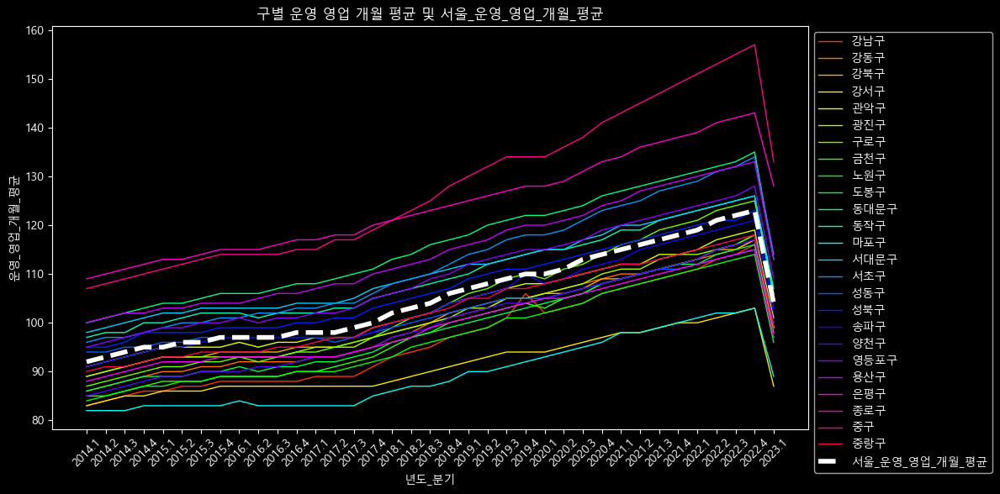

운영 영업 개월 수가 평균보다 높은 지역구: 동대문구, 동작구, 서대문구, 서초구, 성북구, 영등포구, 용산구, 종로구, 중구, 

In [56]:
# '년도_분기' 열 생성
store_oac['년도_분기'] = store_oac['기준_년_코드'].astype(str) + '.' + store_oac['기준_분기_코드'].astype(str)

# '년도_분기' 열을 기준으로 데이터프레임 정렬
store_oac.sort_values(by='년도_분기', inplace=True)

# 그래프 설정
plt.figure(figsize=(12, 6))

# 서울_운영_영업_개월_평균 데이터 생성
seoul_avg_operating_months = store_oac['서울_운영_영업_개월_평균']

# 구별로 그래프를 그릴 것이므로, 각 구의 색상을 다르게 설정합니다.
palette = sns.color_palette("hsv", len(store_oac['시군구_코드_명'].unique()))

# 시군구_코드_명별로 그래프 그리기
for i, (label, df) in enumerate(store_oac.groupby('시군구_코드_명')):
    # 각 구의 데이터를 분기별로 선택
    x = df['년도_분기']
    y = df['운영_영업_개월_평균']
    
    # 라인 플롯으로 그래프 그리기
    plt.plot(x, y, label=label, color=palette[i], linewidth=1)  # 선의 두께를 2로 조절

# 서울_운영_영업_개월_평균을 기울기로 하는 선 그리기
plt.plot(store_oac['년도_분기'], seoul_avg_operating_months, label='서울_운영_영업_개월_평균', 
         linestyle='--', color='white', linewidth=4)  # 선의 두께를 2로 조절

# 그래프 제목과 축 레이블 설정
plt.title('구별 운영 영업 개월 평균 및 서울_운영_영업_개월_평균')
plt.xlabel('년도_분기')
plt.ylabel('운영_영업_개월_평균')

# 범례 표시
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# x축 눈금 라벨 회전
plt.xticks(rotation=45)

# 그래프 스타일 설정
plt.style.use('dark_background')  # 배경색을 검은색으로 설정

# 그래프 출력
plt.tight_layout()
plt.show()

# 서울 평균 운영 영업 개월 평균 값 계산
seoul_avg_operating_months_avg = seoul_avg_operating_months.mean()

# 운영 영업 개월수가 평균보다 높은 지역구 출력
print("운영 영업 개월 수가 평균보다 높은 지역구:", end=" ")
for label, df in store_oac.groupby('시군구_코드_명'):
    avg_months = df['운영_영업_개월_평균'].mean()
    if avg_months > seoul_avg_operating_months_avg:
        print(f"{label}", end=", ")

### [그래프] 별 폐업 영업 개월 평균 및 서울_폐업_영업_개월_평균(라인)

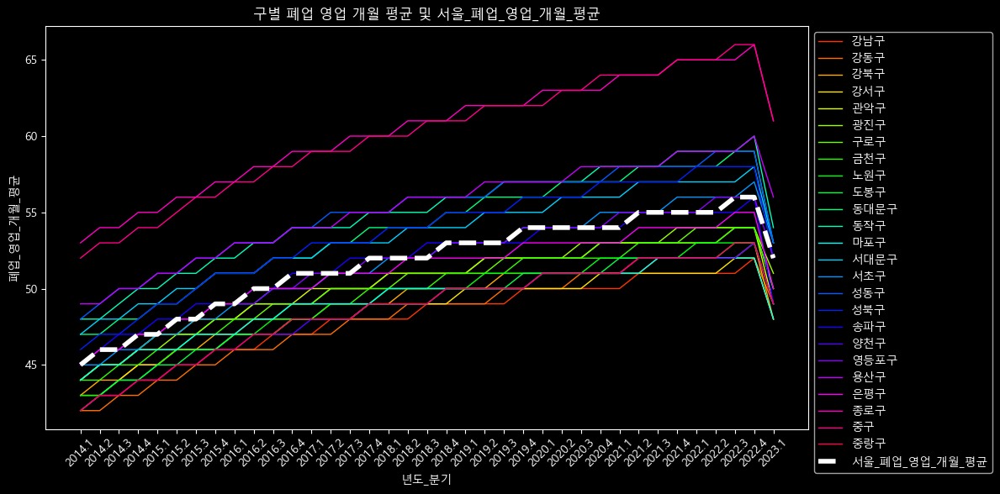

폐점 영업 개월 수가 평균보다 높은 지역구: 동대문구, 동작구, 서대문구, 성동구, 성북구, 용산구, 종로구, 중구, 

In [57]:
# '년도_분기' 열 생성
store_oac['년도_분기'] = store_oac['기준_년_코드'].astype(str) + '.' + store_oac['기준_분기_코드'].astype(str)

# '년도_분기' 열을 기준으로 데이터프레임 정렬
store_oac.sort_values(by='년도_분기', inplace=True)

# 그래프 설정
plt.figure(figsize=(12, 6))

# 서울_폐업_영업_개월_평균 데이터 생성
seoul_avg_closure_months = store_oac['서울_폐업_영업_개월_평균']

# 구별로 그래프를 그릴 것이므로, 각 구의 색상을 다르게 설정합니다.
palette = sns.color_palette("hsv", len(store_oac['시군구_코드_명'].unique()))

# 시군구_코드_명별로 그래프 그리기
for i, (label, df) in enumerate(store_oac.groupby('시군구_코드_명')):
    # 각 구의 데이터를 분기별로 선택
    x = df['년도_분기']
    y = df['폐업_영업_개월_평균']
    
    # 라인 플롯으로 그래프 그리기
    plt.plot(x, y, label=label, color=palette[i], linewidth=1)  # 선의 두께를 2로 조절

# 서울_폐업_영업_개월_평균을 기울기로 하는 선 그리기
plt.plot(store_oac['년도_분기'], seoul_avg_closure_months, label='서울_폐업_영업_개월_평균', 
         linestyle='--', color='white', linewidth=4)  # 선의 두께를 2로 조절

# 그래프 제목과 축 레이블 설정
plt.title('구별 폐업 영업 개월 평균 및 서울_폐업_영업_개월_평균')
plt.xlabel('년도_분기')
plt.ylabel('폐업_영업_개월_평균')

# 범례 표시
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# x축 눈금 라벨 회전
plt.xticks(rotation=45)

# 그래프 스타일 설정
plt.style.use('dark_background')  # 배경색을 검은색으로 설정

# 그래프 출력
plt.tight_layout()
plt.show()

# 서울 평균 폐업 영업 개월 평균 값 계산
seoul_avg_closure_months_avg = seoul_avg_closure_months.mean()

# 폐점 영업 개월수가 평균보다 높은 지역구 출력
print("폐점 영업 개월 수가 평균보다 높은 지역구:", end=" ")
for label, df in store_oac.groupby('시군구_코드_명'):
    avg_months = df['폐업_영업_개월_평균'].mean()
    if avg_months > seoul_avg_closure_months_avg:
        print(f"{label}", end=", ")

### [지도X]  평균 운영 영업 개월 수

In [58]:
import folium
import pandas as pd
import json


# 서울시 시군구 경계 데이터를 불러옵니다. (GeoJSON 형식)
seoul_geojson_url = 'https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json'

# folium 지도 객체를 생성합니다.
m = folium.Map(location=[37.566345, 126.977893], zoom_start=11)  # 서울시 중심 좌표로 지도 생성

# 서울시 시군구 경계를 GeoJSON으로 추가합니다.
folium.GeoJson(
    name='seoul_municipalities',
    data=seoul_geojson_url
).add_to(m)

# Choropleth를 사용하여 시군구별 데이터를 시각화합니다.
folium.Choropleth(
    geo_data=seoul_geojson_url,
    name='choropleth',
    data=store_oac,
    columns=['시군구_코드_명', '운영_영업_개월_평균'],
    key_on='feature.properties.name',
    fill_color='YlGn',  # 색상 맵 (YlGn: 노란색에서 녹색까지)
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='평균 운영 영업 개월'
).add_to(m)

# 지도를 HTML 파일로 저장하거나 화면에 출력할 수 있습니다.
#m.save('seoul_choropleth_map.html')  # HTML 파일로 저장
m

#geojson=seoul_geo,
#locations='full_name'


### [지도X] 2020.1Q ~ 2023.1Q  평균 운영 영업 개월 수[for문]

In [59]:
import plotly.express as px
import pandas as pd


# 분기별로 Choropleth 지도를 생성합니다.
for year in range(2020, 2023):
    for quarter in range(1, 5):
        quarter_str = f'{year}.{quarter}'
        
        # 분기별 데이터를 필터링합니다.
        filtered_data = store_oac[store_oac['년분기'] == quarter_str]
        
        # Choropleth 지도를 생성합니다.
        fig = px.choropleth_mapbox(
            filtered_data,
            geojson=geo_data,  # 서울시 시군구 경계 GeoJSON 데이터
            locations='시군구_코드_명',  # 시군구 코드명 열
            featureidkey='properties.name',
            color='자치구_운영영업평균차이',  # 시각화할 데이터 열
            color_continuous_scale='YlGn',  # 색상 맵 (노란색에서 녹색까지)
            mapbox_style="carto-positron",
            center={"lat": 37.566345, "lon": 126.977893},
            zoom=9,
            title=f'평균 운영 영업 개월 ({quarter_str}Q)'
        )
        
        # 그래프를 나타냅니다.
        fig.show()

### [지도X] 2020.1Q ~ 2023.1Q  자치구_폐업영업평균차이[for문]

In [174]:
import plotly.express as px
import pandas as pd


# 분기별로 Choropleth 지도를 생성합니다.
for year in range(2020, 2023):
    for quarter in range(1, 5):
        quarter_str = f'{year}.{quarter}'
        
        # 분기별 데이터를 필터링합니다.
        filtered_data = store_oac[store_oac['년분기'] == quarter_str]
        
        # Choropleth 지도를 생성합니다.
        fig = px.choropleth_mapbox(
            filtered_data,
            geojson=geo_data,  # 서울시 시군구 경계 GeoJSON 데이터
            locations='시군구_코드_명',  # 시군구 코드명 열
            featureidkey='properties.name',
            color='자치구_폐업영업평균차이',  # 시각화할 데이터 열
            color_continuous_scale='YlGn',  # 색상 맵 (노란색에서 녹색까지)
            mapbox_style="carto-positron",
            center={"lat": 37.566345, "lon": 126.977893},
            zoom=9,
            title=f'자치구_폐업영업평균차이 ({quarter_str}Q)'
        )
        
        # 그래프를 나타냅니다.
        fig.show()

In [74]:
se_store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27250 entries, 0 to 27249
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   기준_년_코드     27250 non-null  int64  
 1   기준_분기_코드    27250 non-null  int64  
 2   상권_구분_코드    27250 non-null  object 
 3   상권_구분_코드_명  27250 non-null  object 
 4   상권_코드       27250 non-null  int64  
 5   상권_코드_명     27250 non-null  object 
 6   집객시설_수      27250 non-null  int64  
 7   관공서_수       25850 non-null  float64
 8   은행_수        23543 non-null  float64
 9   종합병원_수      3305 non-null   float64
 10  일반_병원_수     11430 non-null  float64
 11  약국_수        26357 non-null  float64
 12  유치원_수       18636 non-null  float64
 13  초등학교_수      20805 non-null  float64
 14  중학교_수       14218 non-null  float64
 15  고등학교_수      11245 non-null  float64
 16  대학교_수       6084 non-null   float64
 17  백화점_수       473 non-null    float64
 18  슈퍼마켓_수      9433 non-null   float64
 19  극장_수        6056 non-null

## [파일] 서울시 상권분석서비스(행정동별 상권변화지표)

In [75]:
### 서울시 상권분석서비스(행정동별 상권변화지표)
se_store_oac = pd.read_csv("vis_project/서울시 상권분석서비스(행정동별 상권변화지표).csv", encoding='cp949')
se_store_oac.tail()

,기준_년_코드,기준_분기_코드,행정동_코드,행정동_코드_명,상권_변화_지표,상권_변화_지표_명,운영_영업_개월_평균,폐업_영업_개월_평균,서울_운영_영업_개월_평균,서울_폐업_영업_개월_평균,년분기
15684,2014,1,11110560,평창동,HH,정체,95,51,92,45,"2,014"
15685,2014,1,11110550,부암동,LH,상권확장,92,48,92,45,"2,014"
15686,2014,1,11110540,삼청동,LH,상권확장,78,49,92,45,"2,014"
15687,2014,1,11110530,사직동,HH,정체,103,51,92,45,"2,014"
15688,2014,1,11110515,청운효자동,LH,상권확장,91,53,92,45,"2,014"


In [76]:
se_store_oac["영업지역평균차이"] = se_store_oac['서울_운영_영업_개월_평균'] - se_store_oac['운영_영업_개월_평균']
se_store_oac["폐업지역평균차이"] = se_store_oac['서울_폐업_영업_개월_평균'] - se_store_oac['폐업_영업_개월_평균'] 
se_store_oac

,기준_년_코드,기준_분기_코드,행정동_코드,행정동_코드_명,상권_변화_지표,상권_변화_지표_명,운영_영업_개월_평균,폐업_영업_개월_평균,서울_운영_영업_개월_평균,서울_폐업_영업_개월_평균,년분기,영업지역평균차이,폐업지역평균차이
0,2023,1,11740700,둔촌2동,HL,상권축소,106,49,104,52,"2,023",-2,3
1,2023,1,11740690,둔촌1동,HH,정체,160,62,104,52,"2,023",-56,-10
2,2023,1,11740685,길동,LL,다이나믹,102,47,104,52,"2,023",2,5
3,2023,1,11740660,성내3동,HL,상권축소,109,46,104,52,"2,023",-5,6
4,2023,1,11740650,성내2동,LL,다이나믹,103,45,104,52,"2,023",1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15684,2014,1,11110560,평창동,HH,정체,95,51,92,45,"2,014",-3,-6
15685,2014,1,11110550,부암동,LH,상권확장,92,48,92,45,"2,014",0,-3
15686,2014,1,11110540,삼청동,LH,상권확장,78,49,92,45,"2,014",14,-4
15687,2014,1,11110530,사직동,HH,정체,103,51,92,45,"2,014",-11,-6


In [77]:
# 데이터 행정동 전처리
for index, row in se_store_oac.iterrows():
    if row['행정동_코드'] == 11680510:
        se_store_oac.at[index, '주소'] = '서울특별시 강남구 신사동'
    elif row['행정동_코드'] == 11620685:
        se_store_oac.at[index, '주소'] = '서울특별시 관악구 신사동'
    elif row['행정동_코드_명'] == '상일동':
        se_store_oac.at[index, '주소'] = '서울특별시 강동구 상일동'
    elif row['행정동_코드_명'] == '종로1?2?3?4가동':
        se_store_oac.at[index, '주소'] = '서울특별시 종로구 종로1.2.3.4가동'
    elif row['행정동_코드_명'] == '종로5?6가동':
        se_store_oac.at[index, '주소'] = '서울특별시 종로구 종로5.6가동'
    elif '?' in row['행정동_코드_명']:
        corrected_code = row['행정동_코드_명'].replace('?', '.')
        se_store_oac.at[index, '주소'] = f'서울특별시 {corrected_code}'
    elif row['행정동_코드_명'] in se_cop_merge1['동별'].values:
        se_merge_row = se_cop_merge1.loc[se_cop_merge1['동별'] == row['행정동_코드_명']]
        se_store_oac.at[index, '주소'] = se_merge_row['full_name'].values[0]

In [78]:
# 컬럼생성 2023.1 형태로 만들기
#se_store_oac['년분기'] = se_store_oac['기준_년_코드'].astype(str) +"."+ store_oac['기준_분기_코드'].astype(str)

In [79]:
#해당구 컬럼 만들기
se_store_oac['구'] = se_store_oac['주소'].str.split(' ').str[1]
se_store_oac

,기준_년_코드,기준_분기_코드,행정동_코드,행정동_코드_명,상권_변화_지표,상권_변화_지표_명,운영_영업_개월_평균,폐업_영업_개월_평균,서울_운영_영업_개월_평균,서울_폐업_영업_개월_평균,년분기,영업지역평균차이,폐업지역평균차이,주소,구
0,2023,1,11740700,둔촌2동,HL,상권축소,106,49,104,52,"2,023",-2,3,서울특별시 강동구 둔촌2동,강동구
1,2023,1,11740690,둔촌1동,HH,정체,160,62,104,52,"2,023",-56,-10,서울특별시 강동구 둔촌1동,강동구
2,2023,1,11740685,길동,LL,다이나믹,102,47,104,52,"2,023",2,5,서울특별시 강동구 길동,강동구
3,2023,1,11740660,성내3동,HL,상권축소,109,46,104,52,"2,023",-5,6,서울특별시 강동구 성내3동,강동구
4,2023,1,11740650,성내2동,LL,다이나믹,103,45,104,52,"2,023",1,7,서울특별시 강동구 성내2동,강동구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15684,2014,1,11110560,평창동,HH,정체,95,51,92,45,"2,014",-3,-6,서울특별시 종로구 평창동,종로구
15685,2014,1,11110550,부암동,LH,상권확장,92,48,92,45,"2,014",0,-3,서울특별시 종로구 부암동,종로구
15686,2014,1,11110540,삼청동,LH,상권확장,78,49,92,45,"2,014",14,-4,서울특별시 종로구 삼청동,종로구
15687,2014,1,11110530,사직동,HH,정체,103,51,92,45,"2,014",-11,-6,서울특별시 종로구 사직동,종로구


### [그래프] 행정동별_운영 영업 개월 평균 vs 폐업 영업 개월 평균

In [80]:
import plotly.express as px


# 데이터에서 2014년부터 2023년까지의 데이터만 필터링합니다.
filtered_data = se_store_oac[(se_store_oac['년분기'] >= 2014.1) & (se_store_oac['기준_년_코드'] <= 2023.1)]

# 년도별로 시군구 코드명에 따른 운영 영업 개월 평균과 폐업 영업 개월 평균의 관계를 나타내는 산점도
fig = px.scatter(filtered_data, x='운영_영업_개월_평균', y='폐업_영업_개월_평균', color='행정동_코드_명',
                 title='운영 영업 개월 평균 vs. 폐업 영업 개월 평균 (시군구별, 2014.1Q ~ 2023.1Q 분기)',
                 labels={'운영_영업_개월_평균': '운영 영업 개월 평균', '폐업_영업_개월_평균': '폐업 영업 개월 평균'},
                 template='plotly_dark')
fig.show()


#py.plot(fig, filename="'동별_운영 영업 개월 평균 vs 폐업 영업 개월 평균 (시군구별, 2024.1Q ~ 2023.1Q 분기별).png'", auto_open=True) 


### [그래프] 행정동별 영업지역평균차이 vs. 폐업지역평균차이 (시군구별, 2014.1Q ~ 2023.1Q 분기)

In [81]:
import plotly.express as px


# 데이터에서 2014년부터 2023년까지의 데이터만 필터링합니다.
filtered_data = se_store_oac[(se_store_oac['년분기'] >= 2014.1) & (se_store_oac['기준_년_코드'] <= 2023.1)]

# 년도별로 시군구 코드명에 따른 운영 영업 개월 평균과 폐업 영업 개월 평균의 관계를 나타내는 산점도
fig = px.scatter(filtered_data, x='영업지역평균차이', y='폐업지역평균차이', color='행정동_코드_명',
                 title='영업지역평균차이 vs. 폐업지역평균차이 (시군구별, 2014.1Q ~ 2023.1Q 분기)',
                 labels={'운영_영업_개월_평균': '운영 영업 개월 평균', '폐업_영업_개월_평균': '폐업 영업 개월 평균'},
                 template='plotly_dark')
fig.show()

#py.plot(fig, filename="영업지역평균차이 vs. 폐업지역평균차이 (시군구별, 2014.1Q ~ 2023.1Q 분기).png", auto_open=True) 


### [그래프X] 년도 및 분기별 구별 폐업 개월 평균 (2018.1Q ~ 2023.1Q)

In [82]:
import plotly.express as px

# 데이터에서 2014년부터 2023년까지의 데이터만 필터링합니다.
filtered_data = se_store_oac[(se_store_oac['년분기'] >= 2018.1) & (se_store_oac['기준_년_코드'] <= 2023.1)]

# 년도와 분기를 추출합니다.
filtered_data['년도'] = filtered_data['기준_년_코드']
filtered_data['분기'] = filtered_data['기준_분기_코드']

# 그룹화된 데이터를 생성합니다.
grouped_data = filtered_data.groupby(['년도', '분기', '구'])['폐업_영업_개월_평균'].mean().reset_index()

# 년도와 분기별로 그래프를 생성합니다.
fig = px.bar(grouped_data, x='년도', y='폐업_영업_개월_평균', color='구', facet_col='분기',
             title='년도 및 분기별 구별 폐업 개월 평균 (2018.1Q ~ 2023.1Q)',
             labels={'운영_영업_개월_평균': '폐업 영업 개월 평균', '년도': '년도', '분기': '분기'},
             template='plotly_dark')
fig.show()



## [파일] 서울시 상권분석서비스(상권영역)

In [83]:
se_pop = pd.read_csv("vis_project/서울시 상권분석서비스(상권영역).csv", encoding='cp949')
se_pop.drop('형태정보', axis=1, inplace=True)
se_pop

,기준_년월_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,상권_코드_명,엑스좌표_값,와이좌표_값,시군구_코드,행정동_코드
0,202212,A,골목상권,3110008,배화여자대학교(박노수미술관),197093,453418,11110,11110515
1,202212,A,골목상권,3110009,자하문터널,196991,455057,11110,11110550
2,202212,A,골목상권,3110010,평창동서측,197064,456643,11110,11110560
3,202212,A,골목상권,3110017,정독도서관,198581,453781,11110,11110600
4,202212,A,골목상권,3110018,중앙고등학교,198883,453690,11110,11110600
...,...,...,...,...,...,...,...,...,...
1645,202212,U,관광특구,3001492,명동 남대문 북창동 다동 무교동 관광특구,198397,451614,11140,11140520
1646,202212,U,관광특구,3001493,동대문패션타운 관광특구,200996,451976,11140,11140590
1647,202212,U,관광특구,3001494,종로?청계 관광특구,199796,452274,11110,11110615
1648,202212,U,관광특구,3001495,잠실 관광특구,210188,446334,11710,11710566


In [84]:
se_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1650 entries, 0 to 1649
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   기준_년월_코드    1650 non-null   int64 
 1   상권_구분_코드    1650 non-null   object
 2   상권_구분_코드_명  1650 non-null   object
 3   상권_코드       1650 non-null   int64 
 4   상권_코드_명     1650 non-null   object
 5   엑스좌표_값      1650 non-null   int64 
 6   와이좌표_값      1650 non-null   int64 
 7   시군구_코드      1650 non-null   int64 
 8   행정동_코드      1650 non-null   int64 
dtypes: int64(6), object(3)
memory usage: 116.1+ KB


## [파일] 서울시_상권분석서비스(상권배후지_추정매출)

In [85]:
#se_sales = pd.read_csv("서울시_상권분석서비스(상권배후지_추정매출).csv", encoding='cp949')
se_sales = pd.read_csv("vis_project/서울시_상권분석서비스(상권배후지_추정매출).csv", encoding='cp949')

se_sales.tail()

,기준_년_코드,기준_분기_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,상권_코드_명,서비스_업종_코드,서비스_업종_코드_명,분기당_매출_금액,분기당_매출_건수,...,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수
619268,2021,4,A,골목상권,2111090,강일동주민센터,CS300016,안경,"88,725,327",1256,...,0,582,674,14,248,218,349,321,106,6
619269,2021,4,A,골목상권,2111090,강일동주민센터,CS300018,의약품,"694,963,337",47842,...,195,23633,22921,394,4369,9490,12931,9250,10120,16
619270,2021,4,A,골목상권,2111090,강일동주민센터,CS300020,서적,"147,797,108",1930,...,0,165,1709,0,55,275,993,551,0,3
619271,2021,4,A,골목상권,2111090,강일동주민센터,CS300021,문구,"34,937,139",4652,...,0,1862,2489,172,449,1082,1767,473,408,3
619272,2021,4,A,골목상권,2111090,강일동주민센터,CS300022,화장품,"67,343,197",251,...,26,0,251,0,0,0,173,52,26,6


In [86]:
se_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 619273 entries, 0 to 619272
Data columns (total 80 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   기준_년_코드          619273 non-null  int64  
 1   기준_분기_코드         619273 non-null  int64  
 2   상권_구분_코드         619273 non-null  object 
 3   상권_구분_코드_명       619273 non-null  object 
 4   상권_코드            619273 non-null  int64  
 5   상권_코드_명          578316 non-null  object 
 6   서비스_업종_코드        619273 non-null  object 
 7   서비스_업종_코드_명      619273 non-null  object 
 8   분기당_매출_금액        619273 non-null  float64
 9   분기당_매출_건수        619273 non-null  int64  
 10  주중_매출_비율         619273 non-null  int64  
 11  주말_매출_비율         619273 non-null  int64  
 12  월요일_매출_비율        619273 non-null  int64  
 13  화요일_매출_비율        619273 non-null  int64  
 14  수요일_매출_비율        619273 non-null  int64  
 15  목요일_매출_비율        619273 non-null  int64  
 16  금요일_매출_비율        619273 non-null  int6

In [87]:
##### 파일을 합칠경우 정확한 구와 동까지 나오고 상권_구분_코드_명은 골목상권만 해당됨

In [88]:
#서울시, 유동인구 합치기 
join = pd.merge(se_sales, se_pop, on="상권_코드")
join.head(5)



,기준_년_코드,기준_분기_코드,상권_구분_코드_x,상권_구분_코드_명_x,상권_코드,상권_코드_명_x,서비스_업종_코드,서비스_업종_코드_명,분기당_매출_금액,분기당_매출_건수,...,연령대_60_이상_매출_건수,점포수,기준_년월_코드,상권_구분_코드_y,상권_구분_코드_명_y,상권_코드_명_y,엑스좌표_값,와이좌표_값,시군구_코드,행정동_코드
0,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,...,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
1,2023,1,A,골목상권,3111090,NaN,CS300021,문구,"38,566,991",3854,...,366,*,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
2,2023,1,A,골목상권,3111090,NaN,CS300020,서적,"105,936,679",1874,...,165,*,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
3,2023,1,A,골목상권,3111090,NaN,CS300018,의약품,"517,606,756",52389,...,14379,7,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
4,2023,1,A,골목상권,3111090,NaN,CS300016,안경,"97,837,400",1038,...,138,*,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515


## [파일] 서울시 건축물대장 법정동 코드정보

In [89]:
# 법정구 코드명 취합
#se_code = pd.read_csv("서울시 건축물대장 법정동 코드정보.csv", encoding='euc-kr')
se_code = pd.read_csv("vis_project/서울시 건축물대장 법정동 코드정보.csv", encoding='euc-kr')
#se_code = se_code[["시군구코드","행정동코드", "시군구명", "행정동명"]].drop_duplicates('시군구코드', keep='first')
se_code.sample(10)

,시군구코드,법정동코드,행정동코드,시도명,시군구명,법정동명,행정동명,적용시작일,적용만료일
85,11560,12400,605,서울특별시,영등포구,문래동6가,문래동,20080901,99991231
1379,11440,12400,0,서울특별시,마포구,연남동,NaN,19880423,99991231
138,11410,10400,565,서울특별시,서대문구,미근동,충현동,20080506,99991231
1047,11740,700,0,서울특별시,강동구,가락동,NaN,19880423,19880423
886,11260,91300,0,서울특별시,중랑구,묵2동,NaN,19880423,19880423
1206,11350,10300,590,서울특별시,노원구,공릉동,공릉제1동,19880423,99991231
1735,11110,13300,0,서울특별시,종로구,익선동,NaN,19880423,99991231
1944,11290,11300,550,서울특별시,성북구,삼선동3가,삼선제2동,19880423,20071230
1447,11740,10400,0,서울특별시,강동구,하일동,NaN,19880423,20070101
381,11215,10300,860,서울특별시,광진구,구의동,구의제2동,19950301,99991231


In [90]:
se_code.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2355 entries, 0 to 2354
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   시군구코드   2355 non-null   int64 
 1   법정동코드   2355 non-null   int64 
 2   행정동코드   2355 non-null   int64 
 3   시도명     2355 non-null   object
 4   시군구명    2354 non-null   object
 5   법정동명    2355 non-null   object
 6   행정동명    1243 non-null   object
 7   적용시작일   2355 non-null   int64 
 8   적용만료일   2355 non-null   int64 
dtypes: int64(5), object(4)
memory usage: 165.7+ KB


In [91]:
se_code= se_code[['시군구코드', '법정동코드', '시군구명', '법정동명']]

In [92]:
join.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40957 entries, 0 to 40956
Data columns (total 88 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   기준_년_코드          40957 non-null  int64  
 1   기준_분기_코드         40957 non-null  int64  
 2   상권_구분_코드_x       40957 non-null  object 
 3   상권_구분_코드_명_x     40957 non-null  object 
 4   상권_코드            40957 non-null  int64  
 5   상권_코드_명_x        0 non-null      object 
 6   서비스_업종_코드        40957 non-null  object 
 7   서비스_업종_코드_명      40957 non-null  object 
 8   분기당_매출_금액        40957 non-null  float64
 9   분기당_매출_건수        40957 non-null  int64  
 10  주중_매출_비율         40957 non-null  int64  
 11  주말_매출_비율         40957 non-null  int64  
 12  월요일_매출_비율        40957 non-null  int64  
 13  화요일_매출_비율        40957 non-null  int64  
 14  수요일_매출_비율        40957 non-null  int64  
 15  목요일_매출_비율        40957 non-null  int64  
 16  금요일_매출_비율        40957 non-null  int64  
 17  토요일_매출_비율   

In [170]:
join

,기준_년_코드,기준_분기_코드,상권_구분_코드_x,상권_구분_코드_명_x,상권_코드,상권_코드_명_x,서비스_업종_코드,서비스_업종_코드_명,분기당_매출_금액,분기당_매출_건수,주중_매출_비율,주말_매출_비율,월요일_매출_비율,화요일_매출_비율,수요일_매출_비율,목요일_매출_비율,금요일_매출_비율,토요일_매출_비율,일요일_매출_비율,시간대_00~06_매출_비율,시간대_06~11_매출_비율,시간대_11~14_매출_비율,시간대_14~17_매출_비율,시간대_17~21_매출_비율,시간대_21~24_매출_비율,남성_매출_비율,여성_매출_비율,연령대_10_매출_비율,연령대_20_매출_비율,연령대_30_매출_비율,연령대_40_매출_비율,연령대_50_매출_비율,연령대_60_이상_매출_비율,주중_매출_금액,주말_매출_금액,월요일_매출_금액,화요일_매출_금액,수요일_매출_금액,목요일_매출_금액,금요일_매출_금액,토요일_매출_금액,일요일_매출_금액,시간대_00~06_매출_금액,시간대_06~11_매출_금액,시간대_11~14_매출_금액,시간대_14~17_매출_금액,시간대_17~21_매출_금액,시간대_21~24_매출_금액,남성_매출_금액,여성_매출_금액,연령대_10_매출_금액,연령대_20_매출_금액,연령대_30_매출_금액,연령대_40_매출_금액,연령대_50_매출_금액,연령대_60_이상_매출_금액,주중_매출_건수,주말_매출_건수,월요일_매출_건수,화요일_매출_건수,수요일_매출_건수,목요일_매출_건수,금요일_매출_건수,토요일_매출_건수,일요일_매출_건수,시간대_건수~06_매출_건수,시간대_건수~11_매출_건수,시간대_건수~14_매출_건수,시간대_건수~17_매출_건수,시간대_건수~21_매출_건수,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수,기준_년월_코드,상권_구분_코드_y,상권_구분_코드_명_y,상권_코드_명_y,엑스좌표_값,와이좌표_값,시군구_코드,행정동_코드
0,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,85,15,25,4,15,14,27,3,13,0,12,19,16,28,26,5,95,0,5,6,37,29,23,"62,456,345","11,230,488",18686579,2781135,11204000,"10,065,060","19,719,571","1,827,603","9,402,885",0,"8,648,005","13,720,266","11,389,409","20,712,834",19216319,"3,850,737","68,445,528",0,3851879,"4,481,934","26,489,429","20,835,308","16,637,714",451,105,66,65,93,80,147,40,65,0,39,119,79,240,79,96,447,0,67,67,123,164,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
1,2023,1,A,골목상권,3111090,NaN,CS300021,문구,"38,566,991",3854,83,18,17,15,15,17,19,12,5,0,7,25,36,32,0,43,57,1,5,12,58,13,12,"31,809,407","6,757,584",6351562,5899441,5574979,"6,683,413","7,300,012","4,671,917","2,085,667",0,"2,760,481","9,502,225","14,028,459","12,275,826",0,"14,541,159","19,070,526",315598,1509317,"4,169,265","19,429,977","4,248,165","3,939,363",3216,638,686,544,686,631,669,449,189,0,265,892,1485,1212,0,1525,1992,77,266,508,1827,473,366,*,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
2,2023,1,A,골목상권,3111090,NaN,CS300020,서적,"105,936,679",1874,100,0,16,3,8,31,43,0,0,0,48,12,25,15,0,27,73,0,0,6,71,22,1,"105,936,679",0,16587051,2595731,8861858,"32,537,568","45,354,471",0,0,0,"50,753,977","12,262,210","26,693,041","16,227,451",0,"28,253,236","77,683,443",0,0,"6,481,060","75,196,834","23,222,697","1,036,088",1874,0,332,275,165,385,717,0,0,0,386,331,827,330,0,717,1157,0,0,165,1103,441,165,*,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
3,2023,1,A,골목상권,3111090,NaN,CS300018,의약품,"517,606,756",52389,83,17,19,18,14,15,17,15,3,0,22,29,27,22,0,53,47,0,5,16,24,21,35,"427,368,482","90,238,274",99934218,91864814,74053300,"75,413,813","86,102,337","75,705,548","14,532,726",0,"112,094,614","148,841,523","141,468,655","113,068,445",2133519,"272,045,142","245,561,614",667767,23943710,"80,579,079","124,265,064","107,406,626","180,744,510",43298,9091,9994,8352,8415,8205,8332,6857,2234,0,10953,15088,14445,11669,234,27423,24966,154,3433,8723,14904,10796,14379,7,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
4,2023,1,A,골목상권,3111090,NaN,CS300016,안경,"97,837,400",1038,79,21,22,9,11,14,22,15,6,0,7,29,28,35,1,39,61,0,11,8,30,31,21,"77,268,345","20,569,055",21718468,8793654,11057171,"14,081,839","21,617,213","15,110,174","5,458,881",0,"6,789,145","28,644,850","27,559,622","34,114,470",729313,"38,198,463","59,638,937",346837,10612021,"7,535,591","28,895,238","29,987,052","20,460,661",803,235,200,85,146,172,200,150,85,0,50,353,242,384,9,466,572,11,144,117,331,297,138,*,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40952,2023,1,A,골목상권,3110001,NaN,CS100010,커피-음료,"2,849,056",344,94,6,17,1

## 파일합치기 (서울시 상권분석서비스(상권영역) + 서울시_상권분석서비스(상권배후지_추정매출) + 서울시 건축물대장 법정동 코드정보)

In [176]:
#파일합치기 
#서울시 상권분석서비스(상권영역) + 서울시_상권분석서비스(상권배후지_추정매출) + 서울시 건축물대장 법정동 코드정보
    se_df = pd.merge(join, se_code, left_on="시군구_코드", right_on="시군구코드", how=   #how='inner')
se_df.to_csv("sd_df.csv", encoding='cp949')

In [173]:
se_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3732679 entries, 0 to 3732678
Data columns (total 92 columns):
 #   Column           Dtype  
---  ------           -----  
 0   기준_년_코드          int64  
 1   기준_분기_코드         int64  
 2   상권_구분_코드_x       object 
 3   상권_구분_코드_명_x     object 
 4   상권_코드            int64  
 5   상권_코드_명_x        object 
 6   서비스_업종_코드        object 
 7   서비스_업종_코드_명      object 
 8   분기당_매출_금액        float64
 9   분기당_매출_건수        int64  
 10  주중_매출_비율         int64  
 11  주말_매출_비율         int64  
 12  월요일_매출_비율        int64  
 13  화요일_매출_비율        int64  
 14  수요일_매출_비율        int64  
 15  목요일_매출_비율        int64  
 16  금요일_매출_비율        int64  
 17  토요일_매출_비율        int64  
 18  일요일_매출_비율        int64  
 19  시간대_00~06_매출_비율  int64  
 20  시간대_06~11_매출_비율  int64  
 21  시간대_11~14_매출_비율  int64  
 22  시간대_14~17_매출_비율  int64  
 23  시간대_17~21_매출_비율  int64  
 24  시간대_21~24_매출_비율  int64  
 25  남성_매출_비율         int64  
 26  여성_매출_비율         int64  
 27  연령대_10_매출_비율

In [95]:
# 데이터셋을 확인하면 분기당 매출_금액이 총매출이다.(데이터가 2023,1분기, 카테고리는 골목상권만 확인됨)
se_df.rename(columns={'분기당_매출_금액': '총매출', '분기당_매출_건수': '총건수'}, inplace=True)

In [96]:
#컬럼생성 필요시 진행 예정

# 평단가 컬럼
#se_df['시간대_00~06_단가'] = se_df['시간대_00~06_매출_금액']/se_df['시간대_건수~06_매출_건수']
#se_df['시간대_06~11_단가'] = se_df['시간대_06~11_매출_금액']/se_df['시간대_건수~11_매출_건수']
#se_df['시간대_11~14_단가'] = se_df['시간대_11~14_매출_금액']/se_df['시간대_건수~14_매출_건수']
#se_df['시간대_14~17평단가'] = se_df['시간대_14~17_매출_금액']/se_df['시간대_건수~17_매출_건수']
#se_df['시간대_17~21_평단가'] = se_df['시간대_17~21_매출_금액']/se_df['시간대_건수~21_매출_건수']
#se_df['시간대_21~24_평단가'] = se_df['시간대_21~24_매출_금액']/se_df['시간대_건수~21_매출_건수']


#se_df['연령대_10_단가'] = se_df['연령대_10_매출_금액']/se_df['연령대_10_매출_건수']
#se_df['연령대_20_단가'] = se_df['연령대_20_매출_금액']/se_df['연령대_20_매출_건수']
#se_df['연령대_30_단가'] = se_df['연령대_30_매출_금액']/se_df['연령대_30_매출_건수']
#se_df['연령대_40_단가'] = se_df['연령대_40_매출_금액']/se_df['연령대_40_매출_건수']
#se_df['연령대_50_단가'] = se_df['연령대_50_매출_금액']/se_df['연령대_50_매출_건수']
#se_df['연령대_60_이상_단가'] = se_df['연령대_60_이상_매출_금액']/se_df['연령대_60_이상_매출_건수']


se_df['남성_단가'] = se_df['남성_매출_금액']/se_df['남성_매출_건수']
se_df['여성_단가'] = se_df['여성_매출_금액']/se_df['여성_매출_건수']

In [97]:
# 천 단위 구분 기호 포함
pd.options.display.float_format = '{:,.0f}'.format

### [그래프] 23.1Q 요일별매출

In [98]:
import pandas as pd
import plotly.express as px
import plotly.offline as pyo


# 
# selected_data = se_df[["월요일_매출_금액", "화요일_매출_금액", "수요일_매출_금액", 
#                        "목요일_매출_금액", "금요일_매출_금액", "토요일_매출_금액", "일요일_매출_금액"]]


# total_sales_by_day = selected_data.sum()

# plt.figure(figsize=(8, 8))
# plt.pie(total_sales_by_day, labels=["월요일", "화요일", "수요일", "목요일", "금요일", "토요일", "일요일"], autopct="%1.1f%%", startangle=90)
# plt.title(" 요일별")

# plt.show()
#-------------------



# 데이터셋을 필터링하여 기준_년_코드가 2020.1.2023.1인 데이터만 선택
filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] == 1) |
                      (se_df['기준_년_코드'] == 2023) & (se_df['기준_분기_코드'] == 1)]


# 선택한 데이터에서 요일별 매출을 계산
selected_data = filtered_data[["월요일_매출_금액", "화요일_매출_금액", "수요일_매출_금액", 
                               "목요일_매출_금액", "금요일_매출_금액", "토요일_매출_금액",
                               "일요일_매출_금액"]]
total_sales_by_day = selected_data.sum()
day_names = ["월요일", "화요일", "수요일", "목요일", "금요일", "토요일", "일요일"]


# Pie 차트 생성
fig_pie = px.pie(
    names=day_names,  
    values=total_sales_by_day.values,  
    title="2023.1Q. 요일별 매출",
    hole=0.5
)

# Bar 차트 생성
fig_bar = px.bar(
    x=day_names,
    y=total_sales_by_day.values,
    labels={'x': '요일', 'y': '매출'},
    title="2023.1Q. 요일별 매출"
)

# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray',  # y 축 줄눈 색상을 그레이로 설정
    #font=dict(size=24)
    #font=dict(size=20)
)

# 파이 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',    # 그래프 영역 배경색을 검은색으로 설정
    font_color='white'   # 글자색을 흰색으로 설정
)

# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside', font_size=24)


# 이미지 저장
# import plotly.io as pio
#pio.write_image(fig_bar, '요일별매출(bar).png')
#pio.write_image(fig_pie, '요일별매출(pie).png')

# y축 범례에 숫자 형식 지정
fig.update_layout(
    yaxis_tickformat=',d' # 천 단위 구분 기호와 숫자로 형식 지정
)

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)


# 이미지 저장
# import plotly.io as pio
#pio.write_image(fig_bar, '요일별매출(bar).png')
#pio.write_image(fig_pie, '요일별매출(pie).png')


# plotly_chart_studio 저장
#py.plot(fig_bar, filename="요일별매출(바).png", auto_open=True) 
#py.plot(fig_pie, filename="요일별매출(파이).png", auto_open=True) 

### [그래프] 23.1Q 평일매출

In [169]:
filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] == 1) |
                      (se_df['기준_년_코드'] == 2023) & (se_df['기준_분기_코드'] == 1)]

# 선택한 데이터에서 요일별 매출을 계산
selected_data = filtered_data[["월요일_매출_금액", "화요일_매출_금액", "수요일_매출_금액", 
                               "목요일_매출_금액", "금요일_매출_금액"]]
total_sales_by_day = selected_data.sum()
day_names = ["월요일", "화요일", "수요일", "목요일", "금요일"]



# 천 단위 구분 기호 포함
pd.options.display.float_format = '{:,.0f}'.format


# Pie 차트 생성
fig_pie = px.pie(
    names=day_names,  
    values=total_sales_by_day.values,  
    title="2023.1Q. 평일 매출",
    hole=0.5
)

# Bar 차트 생성
fig_bar = px.bar(
    x=day_names,
    y=total_sales_by_day.values,
    labels={'x': '평일', 'y': '매출'},
    title="2023.1Q. 평일 매출",
)

# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 파이 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',    # 그래프 영역 배경색을 검은색으로 설정
    font_color='white'   # 글자색을 흰색으로 설정
)

# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside')


# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)

# 이미지 저장
# import plotly.io as pio
#pio.write_image(fig_bar, '평일매출(bar).png')
#pio.write_image(fig_pie, '평일매출(pie).png')

# plotly_chart_studio 저장
#py.plot(fig_bar, filename="'평일 요일별 매출(막대).png'", auto_open=True) 
#py.plot(fig_pie, filename="'평일 요일별 매출(파이).png'", auto_open=True) 



### [그래프] 23.1Q 주말매출

In [100]:
# selected_data = se_df[["토요일_매출_금액", "일요일_매출_금액"]]
# total_sales = selected_data.sum()
# plt.figure(figsize=(8, 8))
# plt.pie(total_sales, labels=["토요일", "일요일"], autopct="%1.1f%%", startangle=90)
# plt.title(" 토요일 vs. 일요일 매출 비율")
# plt.show()

filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] == 1) |
                      (se_df['기준_년_코드'] == 2023) & (se_df['기준_분기_코드'] == 1)]

# 천 단위 구분 기호 포함
pd.options.display.float_format = '{:,.0f}'.format

# 필요한 데이터 선택
selected_data = filtered_data[["토요일_매출_금액", "일요일_매출_금액"]]
total_sales_by_day = selected_data.sum()
day_names = ["토요일", "일요일"]

# Pie 차트 생성
fig_pie = px.pie(
    names=day_names,  
    values=total_sales_by_day.values,  
    title="2023.1Q. 토요일 vs 일요일 매출",
    hole=0.5
)

# Bar 차트 생성
fig_bar = px.bar(
    x=day_names,
    y=total_sales_by_day.values,
    labels={'x': '요일', 'y': '매출'},
    title="2023.1Q. 토요일 vs 일요일 매출"
)

# 바 그래프 배경색
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 파이 그래프 배경색
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside')

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)

pio.write_image(fig_bar, '주말매출(bar).png')
pio.write_image(fig_pie, '주말매출(pie).png')


# plotly_chart_studio 저장
#py.plot(fig_bar, filename="'주말 매출(막대).png'", auto_open=True) 
#py.plot(fig_bar, filename="'주말 매출(파이).png'", auto_open=True) 

### [그래프] 23.1Q 주말매출

In [102]:
import pandas as pd
import plotly.express as px
import plotly.offline as pyo

# 데이터 필터링: 기준_년_코드가 2020년 1분기부터 2023년 1분기까지인 데이터 선택
filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] == 1) |
                      (se_df['기준_년_코드'] == 2023) & (se_df['기준_분기_코드'] == 1)]

# 필요한 데이터 선택
selected_data = filtered_data[["서비스_업종_코드_명", "총매출"]]

# 서비스 업종 별 매출 계산
sum_sales_by_category = selected_data.groupby("서비스_업종_코드_명")["총매출"].sum().sort_values().tail(20)

# Bar 차트 생성
fig = px.bar(
    x=sum_sales_by_category.values,
    y=sum_sales_by_category.index,
    orientation='h',  # 수평 바 차트로 설정
    labels={'x': '매출 금액', 'y': '서비스 업종'},
    title="2023.1Q 서비스 업종별 매출 상위 20개"
)


# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 파이 그래프 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside')

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)

#pio.write_image(fig_bar, '주말매출(bar).png')
#pio.write_image(fig_pie, '주말매출(pie).png')



In [147]:
selected_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3732679 entries, 0 to 3732678
Data columns (total 6 columns):
 #   Column           Dtype  
---  ------           -----  
 0   연령대_10_매출_금액     int64  
 1   연령대_20_매출_금액     int64  
 2   연령대_30_매출_금액     float64
 3   연령대_40_매출_금액     float64
 4   연령대_50_매출_금액     float64
 5   연령대_60_이상_매출_금액  float64
dtypes: float64(4), int64(2)
memory usage: 199.3 MB


### [그래프] 23.1Q 남성/여성 매출

In [149]:
filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] == 1) |
                      (se_df['기준_년_코드'] == 2023) & (se_df['기준_분기_코드'] == 1)]

# 선택한 데이터에서 주중과 주말 매출을 계산
selected_data = filtered_data[["남성_매출_금액", "여성_매출_금액"]]
total_sales_by_day = selected_data.sum()
day_names = ["남성", "여성"]

# Pie 차트 생성
fig_pie = px.pie(
    names=day_names,  
    values=total_sales_by_day.values,  
    title="2023.1Q. 남성/여성 매출",
    hole=0.5
)

# Bar 차트 생성
fig_bar = px.bar(
    x=day_names,
    y=total_sales_by_day.values,
    labels={'x': '남성/여성', 'y': '매출'},
    title="2023.1Q. 남성/여성 매출"
)

# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 파이 그래프 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside')

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)


#pio.write_image(fig_bar, '남성여성매출(bar).png')
#pio.write_image(fig_pie, '남성여성매출(pie).png')

#pyo.iplot(fig_pie)

In [104]:
# 1분기 매출이라는 것을 그래프를통해 확인할 수 있었음 (4분면을 나타내고 싶었지만 데이터 셋이 2023년 1분기만 있음)

# import pandas as pd
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots

# # 데이터 필터링: 기준_년_코드가 2020년 1분기부터 2023년 4분기까지인 데이터 선택
# filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] >= 1) &
#                       (se_df['기준_년_코드'] <= 2023) & (se_df['기준_분기_코드'] <= 4)]

# # 시간대 이름
# time_names = ['00~06', '06~11', '11~14', '14~17', '17~21', '21~24']

# # 서브플롯 생성
# fig = make_subplots(
#     rows=2, cols=2,
#     subplot_titles=["1Q", "2Q", "3Q", "4Q"],
#     shared_xaxes=True,  # x축을 공유
#     shared_yaxes=True,  # y축을 공유
#     horizontal_spacing=0.1,  # 그래프 사이의 가로 간격 조정
# )

# row, col = 1, 1
# for quarter in range(1, 5):  # 1분기부터 4분기까지
#     selected_data = filtered_data[filtered_data['기준_분기_코드'] == quarter]
#     total_sales_by_quarter = selected_data[['시간대_00~06_매출_금액', '시간대_06~11_매출_금액',
#                                             '시간대_11~14_매출_금액', '시간대_14~17_매출_금액',
#                                             '시간대_17~21_매출_금액', '시간대_21~24_매출_금액']].sum()

#     fig_quarter = go.Figure(data=[
#         go.Bar(x=time_names, y=total_sales_by_quarter.values)
#     ])
#     fig_quarter.update_layout(
#         title=f'{quarter}분기 시간대별 매출',
#         xaxis_title="시간대",
#         yaxis_title="매출",
#     )

#     # 서브플롯에 추가
#     fig.add_trace(fig_quarter.data[0], row=row, col=col)

#     if col < 2:
#         col += 1
#     else:
#         col = 1
#         row += 1

# fig.update_layout(
#     title_text="분기별 시간대별 매출",
#     showlegend=False,  # 범례 숨기기
#     height=600,  # 그래프 높이 조정
# )

# # 그래프를 Jupyter Notebook에서 표시
# fig.show()


### [그래프] 23.1Q 구별 매출

In [105]:
# 데이터프레임을 기준으로 모든 구를 매출 기준으로 정렬
sorted_data = se_df.groupby('시군구명')['총매출'].sum().reset_index()
sorted_data = sorted_data.sort_values(by='총매출')

# 모든 구의 매출 시각화
fig_bar = px.bar(sorted_data, x='총매출', y='시군구명', orientation='h', title='서울시 구별 매출')

# 그래프 레이아웃 조정
fig_bar.update_layout(
    xaxis_title='매출',
    yaxis_title='구별',
    #width=800,  # 그래프 가로 크기 조정
    height=800,  # 그래프 세로 크기 조정
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    #xaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)





# 파이 차트 생성 (구별 매출 비율)
fig_pie = px.pie(sorted_data, names='시군구명', values='총매출',
                 title='서울시 구별 매출 비율',
                 hole=0.5)



fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)


# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside')

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)


#pio.write_image(fig_bar, '서울시구별매출(bar).png')
#pio.write_image(fig_pie, '서울시구별매출(pie).png')



In [162]:
filtered_data

,기준_년_코드,기준_분기_코드,상권_구분_코드_x,상권_구분_코드_명_x,상권_코드,상권_코드_명_x,서비스_업종_코드,서비스_업종_코드_명,총매출,총건수,주중_매출_비율,주말_매출_비율,월요일_매출_비율,화요일_매출_비율,수요일_매출_비율,목요일_매출_비율,금요일_매출_비율,토요일_매출_비율,일요일_매출_비율,시간대_00~06_매출_비율,시간대_06~11_매출_비율,시간대_11~14_매출_비율,시간대_14~17_매출_비율,시간대_17~21_매출_비율,시간대_21~24_매출_비율,남성_매출_비율,여성_매출_비율,연령대_10_매출_비율,연령대_20_매출_비율,연령대_30_매출_비율,연령대_40_매출_비율,연령대_50_매출_비율,연령대_60_이상_매출_비율,주중_매출_금액,주말_매출_금액,월요일_매출_금액,화요일_매출_금액,수요일_매출_금액,목요일_매출_금액,금요일_매출_금액,토요일_매출_금액,일요일_매출_금액,시간대_00~06_매출_금액,시간대_06~11_매출_금액,시간대_11~14_매출_금액,시간대_14~17_매출_금액,시간대_17~21_매출_금액,시간대_21~24_매출_금액,남성_매출_금액,여성_매출_금액,연령대_10_매출_금액,연령대_20_매출_금액,연령대_30_매출_금액,연령대_40_매출_금액,연령대_50_매출_금액,연령대_60_이상_매출_금액,주중_매출_건수,주말_매출_건수,월요일_매출_건수,화요일_매출_건수,수요일_매출_건수,목요일_매출_건수,금요일_매출_건수,토요일_매출_건수,일요일_매출_건수,시간대_건수~06_매출_건수,시간대_건수~11_매출_건수,시간대_건수~14_매출_건수,시간대_건수~17_매출_건수,시간대_건수~21_매출_건수,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수,기준_년월_코드,상권_구분_코드_y,상권_구분_코드_명_y,상권_코드_명_y,엑스좌표_값,와이좌표_값,시군구_코드,행정동_코드,시군구코드,법정동코드,시군구명,법정동명,남성_단가,여성_단가
0,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,85,15,25,4,15,14,27,3,13,0,12,19,16,28,26,5,95,0,5,6,37,29,23,"62,456,345","11,230,488",18686579,2781135,11204000,"10,065,060","19,719,571","1,827,603","9,402,885",0,"8,648,005","13,720,266","11,389,409","20,712,834",19216319,"3,850,737","68,445,528",0,3851879,"4,481,934","26,489,429","20,835,308","16,637,714",451,105,66,65,93,80,147,40,65,0,39,119,79,240,79,96,447,0,67,67,123,164,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515,11740,10300,강동구,상일동,"40,112","153,122"
1,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,85,15,25,4,15,14,27,3,13,0,12,19,16,28,26,5,95,0,5,6,37,29,23,"62,456,345","11,230,488",18686579,2781135,11204000,"10,065,060","19,719,571","1,827,603","9,402,885",0,"8,648,005","13,720,266","11,389,409","20,712,834",19216319,"3,850,737","68,445,528",0,3851879,"4,481,934","26,489,429","20,835,308","16,637,714",451,105,66,65,93,80,147,40,65,0,39,119,79,240,79,96,447,0,67,67,123,164,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515,11740,10300,강동구,상일동,"40,112","153,122"
2,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,85,15,25,4,15,14,27,3,13,0,12,19,16,28,26,5,95,0,5,6,37,29,23,"62,456,345","11,230,488",18686579,2781135,11204000,"10,065,060","19,719,571","1,827,603","9,402,885",0,"8,648,005","13,720,266","11,389,409","20,712,834",19216319,"3,850,737","68,445,528",0,3851879,"4,481,934","26,489,429","20,835,308","16,637,714",451,105,66,65,93,80,147,40,65,0,39,119,79,240,79,96,447,0,67,67,123,164,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515,11740,10500,강동구,길동,"40,112","153,122"
3,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,85,15,25,4,15,14,27,3,13,0,12,19,16,28,26,5,95,0,5,6,37,29,23,"62,456,345","11,230,488",18686579,2781135,11204000,"10,065,060","19,719,571","1,827,603","9,402,885",0,"8,648,005","13,720,266","11,389,409","20,712,834",19216319,"3,850,737","68,445,528",0,3851879,"4,481,934","26,489,429","20,835,308","16,637,714",451,105,66,65,93,80,147,40,65,0,39,119,79,240,79,96,447,0,67,67,123,164,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515,11740,10400,강동구,하일동,"40,112","153,122"
4,2023,1,A,골목상권,3111090,NaN,CS300022,화장품,"73,686,833",556,85,15,25,4,15,14,27,3,13,0,12,19,16,28,26,5,95,0,5,6,37,29,23,"62,456,345","11,230,488",18686579,2781135,11204000,"10,065,060","19,719,571","1,827,603","9,402,885",0,"8,648,005","13,720,266","11,389,409","20,712,834",19216319,"3,850,737","68,445,528",0,3851879,"4,481,934","26,489,429","20,835,308","16,637,714",451,105,66,65,93,80,147,40,65,0,39,119,79,240,79,96,447,0,67,67,123,164,121,9,202212,A,골목상권,강일동주민센터,215352,451742,11740,11740515,11740,11000,강동구,강일동,"40,112","153,122"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

### [그래프] 23.1Q 연령대멸 매출

In [106]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo

filtered_data = se_df[(se_df['기준_년_코드'] >= 2020) & (se_df['기준_분기_코드'] == 1) |
                      (se_df['기준_년_코드'] == 2023) & (se_df['기준_분기_코드'] == 1)]

# 선택한 데이터에서 시간대별 매출을 계산
selected_data = filtered_data[['연령대_10_매출_금액', '연령대_20_매출_금액', '연령대_30_매출_금액',
       '연령대_40_매출_금액', '연령대_50_매출_금액', '연령대_60_이상_매출_금액', ]]
total_sales_by_age = selected_data.sum()
time_names = ['10대', '20대', '30대','40대','50대', '60대이상']

# Pie 차트 생성
fig_pie = go.Figure(data=[go.Pie(
    labels=time_names,
    values=total_sales_by_age.values,
    hole=0.5
)])
fig_pie.update_layout(title=" 2023.1Q. 연령별 매출")

# Bar 차트 생성
fig_bar = px.bar(
    x=time_names,
    y=total_sales_by_age.values,
    labels={'x': '연령', 'y': '매출'},
    title="2023.1Q. 연령별 매출"
)


# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)

# 파이 그래프 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

# 텍스트
#fig_bar.update_traces(texttemplate='%{y:,.0f}', textposition='outside')

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)


#pio.write_image(fig_bar, '연령별매출(bar).png')
#pio.write_image(fig_pie, '연령별매출(pie).png')



In [107]:
#정확한 동명이 나오지 않는다는 것을 확인함. 
se_df['법정동명'].unique()

array(['상일동', '길동', '하일동', '강일동', '암사동', '고덕동', '명일동', '잠실동', '신천동',
       '송파동', '석촌동', '삼전동', '가락동', '문정동', '장지동', '방이동', '오금동', '거여동',
       '마천동', '이동', '풍납동', '천호동', '성내동', '둔촌동', '강동구', '송파구', '일원동',
       '개포동', '대치동', '압구정동', '신사동', '청담동', '논현동', '수서동', '도곡동', '포이동',
       '강남구', '역삼동', '세곡동', '삼성동', '자곡동', '율현동', '잠원동', '양재동', '원지동',
       '우면동', '염곡동', '내곡동', '신원동', '방배동', '송금동', '학동', '반포동', '서초동',
       '압구정1동', '압구정2동', '청담1동', '청담2동', '삼성1동', '삼성2동', '대치1동', '대치2동',
       '대치3동', '대치4동', '역삼1동', '역삼2동', '도곡1동', '도곡2동', '개포1동', '개포2동',
       '개포3동', '개포4동', '서초구', '서초1동', '서초2동', '서초3동', '반포본동', '반포1동',
       '반포2동', '반포3동', '방배본동', '방배1동', '방배2동', '방배3동', '봉천동', '신림동',
       '관악구', '남현동', '대방동', '신대방동', '노량진동', '상도동', '본동', '흑석동', '동작동',
       '사당동', '상도제1동', '봉천본동', '봉천1동', '봉천2동', '봉천3동', '봉천4동', '봉천5동',
       '봉천6동', '봉천7동', '봉천8동', '봉천9동', '봉천10동', '봉천11동', '신림본동', '신림1동',
       '신림2동', '신림3동', '신림4동', '신림5동', '신림6동', '신림7동', '신림8동', '신림9동',
       '신림10동

In [108]:
# # 모든 시군구명을 기준으로 구 선택
# selected_districts = se_df['시군구명'].unique()

# # 각 구별로 반복하여 그래프 그리기
# for district in selected_districts:
#     top_services = se_df[se_df['시군구명'] == district]
#     top_services = top_services.groupby(['시군구명', '서비스_업종_코드_명'])['총매출'].sum().reset_index()
#     top_services = top_services.nlargest(20, '총매출')
    
#     # 매출 내림차순으로 정렬
#     top_services = top_services.sort_values(by='총매출')
    
#     # 그래프 생성
#     fig = px.bar(top_services, x='총매출', y='서비스_업종_코드_명',
#                  title=f'{district} 구의 상위 20개 서비스 업종의 매출',
#                  labels={'총매출': '분기당 매출 금액', '서비스_업종_코드_명': '서비스 업종'},
#                  orientation='h')  # 수평 막대 그래프
    
#     fig.show()

In [109]:
## 모든 법정동명을 기준으로 선택 > 오래걸림
# selected_districts = se_df['법정동명'].unique()

# # 각 구별로 반복하여 그래프 그리기
# for district in selected_districts:
#     top_services = se_df[se_df['법정동명'] == district]
#     top_services = top_services.groupby(['법정동명', '서비스_업종_코드_명'])['총매출'].sum().reset_index()
#     top_services = top_services.nlargest(20, '총매출')
    
#     # 매출 내림차순으로 정렬
#     top_services = top_services.sort_values(by='총매출')
    
#     # 그래프 생성
#     fig = px.bar(top_services, x='총매출', y='서비스_업종_코드_명',
#                  title=f'{district} 구의 상위 20개 서비스 업종의 매출',
#                  labels={'총매출': '분기당 매출 금액', '서비스_업종_코드_명': '서비스 업종'},
#                  orientation='h')  # 수평 막대 그래프
    
#     fig.show()

### [그래프] 23.1Q 구별 서비스업종코드 상위 10위 매출 추출(for문)

In [168]:
top_services.groupby(['시군구명', '서비스_업종_코드_명'])['총매출']

In [110]:
from plotly.subplots import make_subplots

# 모든 시군구명을 기준으로 구 선택
selected_districts = se_df['시군구명'].unique()

# 그래프의 행과 열 수 설정
rows = 6
cols = 5

# 서브플롯 생성
fig = make_subplots(rows=rows, cols=cols, subplot_titles=selected_districts)

# 각 구별로 반복하여 그래프 그리기
for i, district in enumerate(selected_districts):
    top_services = se_df[se_df['시군구명'] == district]
    top_services = top_services.groupby(['시군구명', '서비스_업종_코드_명'])['총매출'].sum().reset_index()
    
    # 매출 내림차순으로 정렬
    top_services = top_services.sort_values(by='총매출').tail(10)
    
    # 그래프 생성
    trace = px.bar(top_services, x='총매출', y='서비스_업종_코드_명',
                   title=f'{district} 구의 상위 10개 서비스 업종의 매출',
                   labels={'총매출': '분기당 매출 금액', '서비스_업종_코드_명': '서비스 업종'},
                   orientation='h')  # 수평 막대 그래프
    
    # 서브플롯
    row = i // cols + 1
    col = i % cols + 1
    fig.add_trace(trace.data[0], row=row, col=col)

# 레이아웃 설정
fig.update_layout(
    title_text="구별 상위 10개 서비스 업종의 매출",
    showlegend=False,  # 범례 숨기기
    height=2000,  # 그래프 높이 조정
    font=dict(size=7),  # 글자 크기 조정
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    xaxis_gridcolor='gray'  # x 축 줄눈 색상을 그레이로 설정
)

# 그래프를 Jupyter Notebook에서 표시
fig.show()



# 그래프를 이미지로 저장
pio.write_image(fig, '구별매출_subplot.png')


#py.plot(fig, filename="구별_서비스업종별 상위매출 10", auto_open=True) 

In [111]:
# 데이터 확인 결과 
# 한식음식점이 업종 매출 1위(몇구 제외)
# 상위 10위 매출안에 일반교습학학원 금액비용이 높음
# 동대문구 1위 매출은 청과상  
# 금천구 1위 매출은 육류판매
# 용산구 1위 매출은 컴퓨터및주변장치판매

### [그래프]  한식음식점 업종 구별 매출 순위

In [112]:
# 천 단위 구분 기호 포함
pd.options.display.float_format = '{:,.0f}'.format

In [113]:
import pandas as pd
import plotly.express as px

# '한식음식점' 업종 필터링
se_sales = se_df[se_df['서비스_업종_코드_명'] == '한식음식점']

# 전체 매출 계산
total_sales = se_df['총매출'].sum()

# '한식음식점' 업종의 총 매출 계산
kf_sales = se_sales['총매출'].sum()

# 비율 계산
percentage = (kf_sales / total_sales) * 100

# 파이 차트 생성
fig_pie = px.pie(names=['한식음식점', '전체'], values=[percentage, 100 - percentage],
                 title='한식음식점 업종의 전체 매출 비율',
                 labels={'names': '업종', 'values': '비율 (%)'})

# 각 구별로 '한식음식점' 업종의 총매출 합계 계산
kf_by_district = se_sales.groupby('시군구명')['총매출'].sum().reset_index()

# 총매출을 기준으로 각 구를 내림차순으로 정렬하여 순위 매기기
kf_by_district['순위'] = kf_by_district['총매출'].rank(ascending=False, method='dense').astype(int)

# 결과를 순위 순으로 정렬하고 '순위' 열을 인덱스로 설정
kf_by_district = kf_by_district.sort_values(by='순위', ascending=False)
kf_by_district.set_index('순위', inplace=True)

# 바 차트 생성
fig_bar = px.bar(kf_by_district, x='총매출', y='시군구명',
                 orientation='h',
                 title='한식음식점 업종의 구별 매출 순위',
                 labels={'총매출': '매출', '시군구명': '구'},
                 text='총매출')

# 막대 차트의 texttemplate 설정
#fig_bar.update_traces(texttemplate='%{text:,.0f}', textposition='inside')
# 텍스트 제거
fig_bar.update_traces(text='', textposition='none')

# 파이 차트 생성
fig_pie = px.pie(names=['한식음식점', '전체'], values=[percentage, 100 - percentage],
                 title='한식음식점 업종의 전체 매출 비율',
                 labels={'names': '업종', 'values': '비율 (%)'},
                 hole=0.5)

# 그래프 크기 조절
#fig_bar.update_layout(width=600, height=1000)


# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    #yaxis_gridcolor='gray'  # y 축 줄눈 색상을 그레이로 설정
)


# 파이 그래프 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)


# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)


#pio.write_image(fig_bar, '한식음식점매출(bar).png')
#pio.write_image(fig_pie, '한식음식점매출(pie).png')



### [그래프]  일반교습학원 업종 구별 매출 순위

In [114]:
import pandas as pd
import plotly.express as px

# '일반교습학원' 업종 필터링
se_academy = se_df[se_df['서비스_업종_코드_명'] == '일반교습학원']

# 각 구별로 '일반교습학원' 업종의 총매출 합계 계산
academy_by_district = se_academy.groupby('시군구명')['총매출'].sum().reset_index()

# 총매출을 기준으로 각 구를 내림차순으로 정렬하여 순위 매기기
academy_by_district['순위'] = academy_by_district['총매출'].rank(ascending=False, method='dense').astype(int)

# 결과를 순위 순으로 정렬
academy_by_district = academy_by_district.sort_values(by='순위', ascending=False).set_index('순위')

# 바 차트 생성
fig_bar = px.bar(academy_by_district, x='총매출', y='시군구명',
                 orientation='h',
                 title='일반교습학원 업종의 구별 매출 순위',
                 labels={'총매출': '매출', '시군구명': '구'},
                 text='총매출')

# 막대 차트의 texttemplate 설정

#fig_bar.update_traces(texttemplate='%{text:,.0f}', textposition='inside')
# 텍스트 제거
fig_bar.update_traces(text='', textposition='none')


# '일반교습학원' 업종의 총 매출 계산
total_academy_sales = se_academy['총매출'].sum()

# 각 구별 '일반교습학원' 업종의 총 매출을 기반으로 비율 계산
academy_by_district['비율(%)'] = (academy_by_district['총매출'] / total_academy_sales) * 100

# 파이 차트 생성
fig_pie = px.pie(academy_by_district, names='시군구명', values='총매출',
                 title='일반교습학원 업종의 구별 매출 비율',
                  hole=0.5)


# 그래프 크기 조절
fig_bar.update_layout( height=800)


# 바 그래프 배경색을 검은색으로 설정
fig_bar.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
    xaxis_gridcolor='gray'  # x 축 줄눈 색상을 그레이로 설정
)


# 파이 그래프 배경색을 검은색으로 설정
fig_pie.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

# 그래프를 Jupyter Notebook에서 표시
pyo.iplot(fig_bar)
pyo.iplot(fig_pie)


pio.write_image(fig_bar, ' 일반교습학원매출(bar).png')
pio.write_image(fig_pie, ' 일반교습학원매출(pie).png')



# 전체 총 매출 계산
total_sales = se_df['총매출'].sum()

# '일반교습학원' 업종의 총 매출 계산
total_academy_sales = se_academy['총매출'].sum()

# '일반교습학원' 업종의 매출 비율 계산
percentage_vs_total_sales = (total_academy_sales / total_sales) * 100

# 파이 차트 생성
fig_pie1 = px.pie(values=[total_academy_sales, total_sales - total_academy_sales],
                 title='일반교습학원 업종의 전체 총매출 비율',
                 names=['일반교습학원', '전체'],
                 hole=0.5) # hole은 파이 차트의 가운데 공백 크기를 조절합니다.


# 파이 그래프 배경색을 검은색으로 설정
fig_pie1.update_layout(
    paper_bgcolor='black',  # 바탕색을 검은색으로 설정
    plot_bgcolor='black',   # 그래프 영역 배경색을 검은색으로 설정
    font_color='white',     # 글자색을 흰색으로 설정
)

#그래프 그리기
pyo.iplot(fig_pie1)


#pio.write_image(fig_pie1, ' 일반교습학원매출1(pie).png')



In [115]:
# '일반교습학원' 업종 필터링
se_academy = se_df[se_df['서비스_업종_코드_명'] == '일반교습학원']

# 각 구별로 '일반교습학원' 업종의 총매출 합계 계산
academy_by_district = se_academy.groupby('시군구명')['총매출'].sum().reset_index()

# 총매출을 기준으로 각 구를 내림차순으로 정렬하여 순위 매기기
academy_by_district['순위'] = academy_by_district['총매출'].rank(ascending=False, method='dense').astype(int)

# 결과를 순위 순으로 정렬
academy_by_district = academy_by_district.sort_values(by='순위').set_index('순위')

academy_by_district


,시군구명,총매출
순위,,
1,강남구,"22,610,843,625,640"
2,성북구,"7,276,521,226,496"
3,송파구,"5,261,745,830,770"
4,서대문구,"4,056,745,541,856"
5,영등포구,"3,461,498,626,590"
6,강서구,"3,403,767,547,334"
7,동대문구,"3,149,159,098,492"
8,서초구,"3,104,005,735,356"
9,마포구,"2,910,887,013,832"


In [135]:
#동대문구 1위 매출 : 청과상 

ddm_df = se_df[se_df['시군구명'] == '동대문구']
ddm_df.groupby(['시군구명', '서비스_업종_코드_명'])['총매출'].sum().reset_index().groupby('시군구명').apply(lambda x: x.nlargest(30, '총매출')).reset_index(drop=True)

# 동대문구에서 청과상 판매 업종의 총매출 계산
sales_greengrocer = ddm_df[ddm_df['서비스_업종_코드_명'] == '청과상']['총매출'].sum()

# 동대문구 전체 매출 계산
total_sales_ddm = ddm_df['총매출'].sum()

# 청과상 판매의 비율 계산
greengrocer_percentage = (sales_greengrocer / total_sales_ddm) * 100

# 천 단위로 포맷팅하고 '원' 기호 붙이기
formatted_sales = f'{sales_greengrocer/1000:,.0f}원'

print(f"동대문구 전체 매출 중 청과상 판매의 비율: {greengrocer_percentage:.2f}%, {formatted_sales}")

동대문구 전체 매출 중 청과상 판매의 비율: 19.45%, 33,861,232,730원


In [117]:
ddm_df['법정동명'].unique()

array(['전농동', '용두동', '제기동', '신설동', '청량리동', '상봉동', '중화동', '묵동', '망우동',
       '신내동', '중곡동', '능동', '군자동', '종암동', '안암동4가', '안암동5가', '석관동', '보문동1가',
       '보문동2가', '보문동3가', '보문동4가', '보문동5가', '보문동6가', '보문동7가', '창신동', '숭인동',
       '용두1동', '용두2동', '제기1동', '제기2동', '전농1동', '전농2동', '전농3동', '전농4동',
       '답십리1동', '답십리2동', '답십리3동', '답십리4동', '답십리5동', '장안1동', '장안2동',
       '장안3동', '장안4동', '청량리1동', '청량리2동', '휘경1동', '휘경2동', '이문1동', '이문2동',
       '이문3동', '답십리동', '장안동', '면목동', '이문동', '동대문구', '회기동', '휘경동'],
      dtype=object)

In [131]:
ddm_greengrocer.head()

,기준_년_코드,기준_분기_코드,상권_구분_코드_x,상권_구분_코드_명_x,상권_코드,상권_코드_명_x,서비스_업종_코드,서비스_업종_코드_명,총매출,총건수,주중_매출_비율,주말_매출_비율,월요일_매출_비율,화요일_매출_비율,수요일_매출_비율,목요일_매출_비율,금요일_매출_비율,토요일_매출_비율,일요일_매출_비율,시간대_00~06_매출_비율,시간대_06~11_매출_비율,시간대_11~14_매출_비율,시간대_14~17_매출_비율,시간대_17~21_매출_비율,시간대_21~24_매출_비율,남성_매출_비율,여성_매출_비율,연령대_10_매출_비율,연령대_20_매출_비율,연령대_30_매출_비율,연령대_40_매출_비율,연령대_50_매출_비율,연령대_60_이상_매출_비율,주중_매출_금액,주말_매출_금액,월요일_매출_금액,화요일_매출_금액,수요일_매출_금액,목요일_매출_금액,금요일_매출_금액,토요일_매출_금액,일요일_매출_금액,시간대_00~06_매출_금액,시간대_06~11_매출_금액,시간대_11~14_매출_금액,시간대_14~17_매출_금액,시간대_17~21_매출_금액,시간대_21~24_매출_금액,남성_매출_금액,여성_매출_금액,연령대_10_매출_금액,연령대_20_매출_금액,연령대_30_매출_금액,연령대_40_매출_금액,연령대_50_매출_금액,연령대_60_이상_매출_금액,주중_매출_건수,주말_매출_건수,월요일_매출_건수,화요일_매출_건수,수요일_매출_건수,목요일_매출_건수,금요일_매출_건수,토요일_매출_건수,일요일_매출_건수,시간대_건수~06_매출_건수,시간대_건수~11_매출_건수,시간대_건수~14_매출_건수,시간대_건수~17_매출_건수,시간대_건수~21_매출_건수,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수,기준_년월_코드,상권_구분_코드_y,상권_구분_코드_명_y,상권_코드_명_y,엑스좌표_값,와이좌표_값,시군구_코드,행정동_코드,시군구코드,법정동코드,시군구명,법정동명,남성_단가,여성_단가,full_name
4350,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10300,강동구,상일동,"14,460","18,402",서울특별시 동대문구 상일동
4351,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10300,강동구,상일동,"14,460","18,402",서울특별시 동대문구 상일동
4352,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10500,강동구,길동,"14,460","18,402",서울특별시 동대문구 길동
4353,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10400,강동구,하일동,"14,460","18,402",서울특별시 동대문구 하일동
4354,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560

In [138]:
se_greengrocer = se_df[(se_df['서비스_업종_코드_명'] == '청과상')]
se_greengrocer

,기준_년_코드,기준_분기_코드,상권_구분_코드_x,상권_구분_코드_명_x,상권_코드,상권_코드_명_x,서비스_업종_코드,서비스_업종_코드_명,총매출,총건수,주중_매출_비율,주말_매출_비율,월요일_매출_비율,화요일_매출_비율,수요일_매출_비율,목요일_매출_비율,금요일_매출_비율,토요일_매출_비율,일요일_매출_비율,시간대_00~06_매출_비율,시간대_06~11_매출_비율,시간대_11~14_매출_비율,시간대_14~17_매출_비율,시간대_17~21_매출_비율,시간대_21~24_매출_비율,남성_매출_비율,여성_매출_비율,연령대_10_매출_비율,연령대_20_매출_비율,연령대_30_매출_비율,연령대_40_매출_비율,연령대_50_매출_비율,연령대_60_이상_매출_비율,주중_매출_금액,주말_매출_금액,월요일_매출_금액,화요일_매출_금액,수요일_매출_금액,목요일_매출_금액,금요일_매출_금액,토요일_매출_금액,일요일_매출_금액,시간대_00~06_매출_금액,시간대_06~11_매출_금액,시간대_11~14_매출_금액,시간대_14~17_매출_금액,시간대_17~21_매출_금액,시간대_21~24_매출_금액,남성_매출_금액,여성_매출_금액,연령대_10_매출_금액,연령대_20_매출_금액,연령대_30_매출_금액,연령대_40_매출_금액,연령대_50_매출_금액,연령대_60_이상_매출_금액,주중_매출_건수,주말_매출_건수,월요일_매출_건수,화요일_매출_건수,수요일_매출_건수,목요일_매출_건수,금요일_매출_건수,토요일_매출_건수,일요일_매출_건수,시간대_건수~06_매출_건수,시간대_건수~11_매출_건수,시간대_건수~14_매출_건수,시간대_건수~17_매출_건수,시간대_건수~21_매출_건수,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수,기준_년월_코드,상권_구분_코드_y,상권_구분_코드_명_y,상권_코드_명_y,엑스좌표_값,와이좌표_값,시군구_코드,행정동_코드,시군구코드,법정동코드,시군구명,법정동명,남성_단가,여성_단가
4350,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10300,강동구,상일동,"14,460","18,402"
4351,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10300,강동구,상일동,"14,460","18,402"
4352,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10500,강동구,길동,"14,460","18,402"
4353,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,10400,강동구,하일동,"14,460","18,402"
4354,2023,1,A,골목상권,3111088,NaN,CS300009,청과상,"554,151,399",25685,80,20,21,16,9,13,21,12,8,0,13,28,35,24,0,30,70,0,6,6,23,25,39,"441,195,486","112,955,913",114473816,88106531,48489868,"72,128,873","117,996,398","68,787,918","44,167,995",0,"69,757,273","154,859,131","195,086,717","134,448,278",0,"128,849,945","296,546,538",0,25061723,"26,843,611","98,799,889","107,805,645","166,885,612",18361,7324,3391,3388,3456,3465,4661,4283,3041,0,3458,6300,7739,8188,0,8911,16115,0,964,1978,3924,6489,11670,10,202212,A,골목상권,고덕동성당,215015,451172,11740,11740560,11740,11000,강동구,강일동,"14,460","18,402"
...,...,...,...,...,...,...,..

In [160]:
# 'full_name' 열 생성
#ddm_df['full_name'] = "서울특별시 동대문구 " + ddm_df['법정동명']

# 동대문구 서비스업종코드명을 청과상으로 지정
se_greengrocer = se_df[(se_df['서비스_업종_코드_명'] == '청과상')]
se_greengrocer['full_name'] = "서울특별시" + se_greengrocer['시군구명']  + se_greengrocer['법정동명']
#se_greengrocer['full_name'] = se_greengrocer['full_name'].apply(lambda x: x.replace('.','·'))
# 지도 시각화
fig = px.choropleth_mapbox(se_greengrocer,
                           geojson=seoul_geo,
                           locations='full_name',  # GeoJSON과 데이터프레임의 연결 열
                           color='총매출',  # 색상으로 사용할 열
                           color_continuous_scale='viridis',  # 컬러맵 설정
                           featureidkey='properties.adm_nm',  # GeoJSON 내에서 구별 코드를 식별하는 열
                           mapbox_style='carto-positron',  # 지도 스타일 설정
                           zoom=12,  # 초기 줌 레벨
                           center={"lat": 37.573611, "lon": 127.039611},  # 지도 중심 좌표
                           opacity=0.7,  # 맵 색상 투명도
                           labels={'총매출': '청과상 판매 총매출'},  # 라벨 설정
                           title='동대문구 내 청과상 판매 총매출'  # 그래프 제목
                          )

# 지도 표시
fig.show()

In [122]:
# 'full_name' 열 생성
ddm_df['full_name'] = "서울특별시 동대문구 " + ddm_df['법정동명']

# 동대문구 서비스업종코드명을 청과상으로 지정
ddm_greengrocer = se_df[(se_df['시군구명'] == '동대문구') & (se_df['서비스_업종_코드_명'] == '청과상')]
ddm_greengrocer['full_name'] = "서울특별시 동대문구 " + ddm_greengrocer['법정동명']
ddm_greengrocer['full_name'] = ddm_greengrocer['full_name'].apply(lambda x: x.replace('.','·'))
# 지도 시각화
fig = px.choropleth_mapbox(ddm_greengrocer,
                           geojson=seoul_geo,
                           locations='full_name',  # GeoJSON과 데이터프레임의 연결 열
                           color='총매출',  # 색상으로 사용할 열
                           color_continuous_scale='viridis',  # 컬러맵 설정
                           featureidkey='properties.adm_nm',  # GeoJSON 내에서 구별 코드를 식별하는 열
                           mapbox_style='carto-positron',  # 지도 스타일 설정
                           zoom=12,  # 초기 줌 레벨
                           center={"lat": 37.573611, "lon": 127.039611},  # 지도 중심 좌표
                           opacity=0.7,  # 맵 색상 투명도
                           labels={'총매출': '청과상 판매 총매출'},  # 라벨 설정
                           title='동대문구 내 청과상 판매 총매출'  # 그래프 제목
                          )

# 지도 표시
fig.show()

In [ ]:
fig = px.choropleth_mapbox(se_store_oac,
                           geojson=seoul_geo,
                           locations='주소',
                           color='폐업지역평균차이',
                           color_continuous_scale='viridis', featureidkey = 'properties.adm_nm',
                           mapbox_style='carto-positron',
                           zoom=9.5,
                           center = {"lat": 37.563383, "lon": 126.996039},
                           opacity=0.5,
                          )

fig.show()

In [155]:
# 금천구 1위 매출 기준 : 육류

gc_df = se_df[se_df['시군구명'] == '금천구']
gc_df.groupby(['시군구명', '서비스_업종_코드_명'])['총매출'].sum().reset_index().groupby('시군구명').apply(lambda x: x.nlargest(20, '총매출')).reset_index(drop=True)

# 금천구 전체 매출 
total_sales_golden = gc_df[gc_df['시군구명'] == '금천구']['총매출'].sum()

# 육류판매 업종의 총매출 
sales_meat = gc_df[(gc_df['시군구명'] == '금천구') & (gc_df['서비스_업종_코드_명'] == '육류판매')]['총매출'].sum()

# 육류가 차지하는 비율 
meat_percentage = (sales_meat / total_sales_golden) * 100

# 천 단위로 포맷팅하고 '원' 기호 붙이기
formatted_sales = f'{sales_meat/1000:,.0f}원'

print(f"금천구 전체 매출 중 육류 판매의 비율: {meat_percentage:.2f}%, {formatted_sales}")

금천구 전체 매출 중 육류 판매의 비율: 45.89%, 12,370,574,882원


In [156]:
# 용산구 1위 매출 기준 : 컴퓨터및주변장치판매

ys_df = se_df[se_df['시군구명'] == '용산구']
ys_df.groupby(['시군구명', '서비스_업종_코드_명'])['총매출'].sum().reset_index().groupby('시군구명').apply(lambda x: x.nlargest(20, '총매출')).reset_index(drop=True)

# 용산구에서 컴퓨터 및 주변 기기 판매 업종의 총매출 
sales_appliances = ys_df[ys_df['서비스_업종_코드_명'] == '컴퓨터및주변장치판매']['총매출'].sum()

# 용산구 전체 매출 
total_sales_ys = ys_df['총매출'].sum()

# 컴퓨터 및 주변 기기 판매의 비율 
appliances_percentage = (sales_appliances / total_sales_ys) * 100

# 천 단위로 포맷팅하고 '원' 기호 붙이기
formatted_sales = f'{sales_appliances/1000:,.0f}원'

print(f"용산구 전체 매출 중 컴퓨터및주변장치판매의 비율: {appliances_percentage:.2f}%, {formatted_sales}")

용산구 전체 매출 중 컴퓨터및주변장치판매의 비율: 19.08%, 24,509,634,093원


In [158]:
# 추가 진행예정
# 시간대별 매출 및 연령대별 매출 열 선택
columns_to_select = ['시간대_00~06_매출_금액', '시간대_06~11_매출_금액', '시간대_11~14_매출_금액', '시간대_14~17_매출_금액',
                     '시간대_17~21_매출_금액', '시간대_21~24_매출_금액', '서비스_업종_코드_명',
                     '연령대_10_매출_금액', '연령대_20_매출_금액', '연령대_30_매출_금액',
                     '연령대_40_매출_금액', '연령대_50_매출_금액', '연령대_60_이상_매출_금액', '총매출']

# 선택한 열로 새로운 데이터프레임 생성
selected_columns_df = se_df[columns_to_select]

# 시간대별로 연령대별 매출이 가장 높은 서비스 업종 찾기
time_categories_max_sales = selected_columns_df.groupby(['서비스_업종_코드_명']).max()

# 결과 출력
time_categories_max_sales


,시간대_00~06_매출_금액,시간대_06~11_매출_금액,시간대_11~14_매출_금액,시간대_14~17_매출_금액,시간대_17~21_매출_금액,시간대_21~24_매출_금액,연령대_10_매출_금액,연령대_20_매출_금액,연령대_30_매출_금액,연령대_40_매출_금액,연령대_50_매출_금액,연령대_60_이상_매출_금액,총매출
서비스_업종_코드_명,,,,,,,,,,,,,
PC방,"633,814,444","215,785,368","539,495,326","970,103,952","1,538,746,031",874995007,303375620,3421407325,"665,749,253","192,369,618","234,243,887","93,026,220","4,772,940,128"
가구,"6,685,683","2,260,335,497","4,889,563,220","8,073,915,222","3,296,790,310",177543860,0,670753389,"5,515,258,164","3,908,309,482","4,401,984,900","5,998,819,691","15,543,052,864"
가방,"2,840,016","141,554,133","827,528,420","1,023,866,846","939,873,931",87178360,182587893,729085886,"901,982,506","761,219,327","1,432,788,072","362,183,515","2,514,907,740"
가전제품,0,"1,218,576,295","4,437,408,334","5,063,402,396","4,930,216,379",53870516,8301485,1304256408,"6,683,557,057","4,593,046,374","1,878,337,756","1,543,381,574","15,649,603,404"
가전제품수리,"1,488,410","674,688,716","454,023,818","483,450,175","126,968,763",7096551,350384,27520802,"72,451,673","255,263,158","403,991,518","617,894,125","1,164,321,389"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
한의원,"2,619,564","288,819,314","1,055,237,010","1,025,077,540","960,859,998",41228123,11698434,278033700,"706,392,235","719,031,021","878,175,195","1,385,195,438","3,280,020,800"
핸드폰,"27,503,672","945,182,760","2,892,764,300","2,288,792,262","1,444,171,997",46523276,19625623,1423792270,"1,107,522,463","1,473,989,815","1,028,587,312","2,147,323,764","6,124,254,492"
호프-간이주점,"4,661,226,088","330,893,329","218,543,127","201,991,963","1,870,981,525",3673859855,794656868,4232490872,"3,475,937,993","1,176,012,163","1,352,200,141","726,190,641","7,743,703,817"


## [파일-보류]사용할지 안할지 추후 확인
서울시 우리마을 가게 상권분석 서비스(상권배후지 -집객시설)

In [159]:
se_sales = pd.read_csv("vis_project/서울시_상권분석서비스(상권배후지_추정매출).csv", encoding='cp949')

se_sales.tail()

,기준_년_코드,기준_분기_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,상권_코드_명,서비스_업종_코드,서비스_업종_코드_명,분기당_매출_금액,분기당_매출_건수,주중_매출_비율,주말_매출_비율,월요일_매출_비율,화요일_매출_비율,수요일_매출_비율,목요일_매출_비율,금요일_매출_비율,토요일_매출_비율,일요일_매출_비율,시간대_00~06_매출_비율,시간대_06~11_매출_비율,시간대_11~14_매출_비율,시간대_14~17_매출_비율,시간대_17~21_매출_비율,시간대_21~24_매출_비율,남성_매출_비율,여성_매출_비율,연령대_10_매출_비율,연령대_20_매출_비율,연령대_30_매출_비율,연령대_40_매출_비율,연령대_50_매출_비율,연령대_60_이상_매출_비율,주중_매출_금액,주말_매출_금액,월요일_매출_금액,화요일_매출_금액,수요일_매출_금액,목요일_매출_금액,금요일_매출_금액,토요일_매출_금액,일요일_매출_금액,시간대_00~06_매출_금액,시간대_06~11_매출_금액,시간대_11~14_매출_금액,시간대_14~17_매출_금액,시간대_17~21_매출_금액,시간대_21~24_매출_금액,남성_매출_금액,여성_매출_금액,연령대_10_매출_금액,연령대_20_매출_금액,연령대_30_매출_금액,연령대_40_매출_금액,연령대_50_매출_금액,연령대_60_이상_매출_금액,주중_매출_건수,주말_매출_건수,월요일_매출_건수,화요일_매출_건수,수요일_매출_건수,목요일_매출_건수,금요일_매출_건수,토요일_매출_건수,일요일_매출_건수,시간대_건수~06_매출_건수,시간대_건수~11_매출_건수,시간대_건수~14_매출_건수,시간대_건수~17_매출_건수,시간대_건수~21_매출_건수,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수
619268,2021,4,A,골목상권,2111090,강일동주민센터,CS300016,안경,"88,725,327",1256,62,38,19,12,9,11,12,27,11,0,6,28,31,35,0,44,56,1,17,14,34,22,13,"54,818,165","33,907,162",16727270,10458399,7542504,"9,307,037","10,782,955","24,298,057","9,609,105",0,"5,222,755","24,748,412","27,472,655","31,281,505",0,"38,819,674","49,905,653",507938,14973273,"12,183,993","30,135,321","19,630,387","11,294,415",873,383,239,199,159,129,147,257,126,0,69,378,405,404,0,582,674,14,248,218,349,321,106,6
619269,2021,4,A,골목상권,2111090,강일동주민센터,CS300018,의약품,"694,963,337",47842,91,10,23,22,19,15,12,9,1,0,13,50,22,15,0,48,52,0,7,17,27,21,29,"628,939,069","66,024,268",157948555,153907022,133225239,"100,436,996","83,421,257","60,749,021","5,275,247",0,"91,054,291","345,849,938","153,611,343","102,933,821",1513944,"214,534,921","228,572,473",1306696,29808587,"74,284,472","119,565,134","91,939,072","126,203,435",40991,6851,8931,7763,7812,7923,8562,6237,614,0,8836,13487,13584,11740,195,23633,22921,394,4369,9490,12931,9250,10120,16
619270,2021,4,A,골목상권,2111090,강일동주민센터,CS300020,서적,"147,797,108",1930,100,0,13,11,54,7,15,0,0,0,16,41,40,3,0,7,93,0,1,19,42,38,0,"147,797,108",0,18425004,16652908,80324916,"10,945,056","21,449,224",0,0,0,"23,198,999","60,783,912","59,372,246","4,441,951",0,"10,225,857","132,611,256",0,1378879,"27,225,414","60,009,051","54,223,769",0,1930,0,332,442,330,275,551,0,0,0,275,939,606,110,0,165,1709,0,55,275,993,551,0,3
619271,2021,4,A,골목상권,2111090,강일동주민센터,CS300021,문구,"34,937,139",4652,83,17,19,15,19,13,18,11,6,0,7,22,40,31,0,48,52,2,7,27,41,12,12,"29,130,781","5,806,358",6663615,5089761,6586487,"4,650,937","6,139,981","3,882,627","1,923,731",0,"2,489,916","7,581,154","14,037,030","10,829,039",0,"14,895,469","16,306,501",571505,2305818,"8,357,148","12,640,773","3,746,990","3,579,735",3903,749,828,691,817,685,882,525,224,0,331,958,1826,1537,0,1862,2489,172,449,1082,1767,473,408,3
619272,2021,4,A,골목상권,2111090,강일동주민센터,CS300022,화장품,"67,343,197",251,100,0,0,12,25,40,24,0,0,0,43,15,7,25,9,0,100,0,0,0,65,19,16,"67,343,197",0,0,8078535,16554375,"26,818,087","15,892,200",0,0,0,"29,188,674","10,197,495","4,502,790","17,097,358",6356880,0,"67,343,197",0,0,0,"43,849,228","12,766,734","10,727,235",251,0,0,26,80,92,53,0,0,0,105,27,13,80,26,0,251,0,0,0,173,52,26,6


In [164]:
se_sales['상권_구분_코드_명'].unique()

array(['골목상권'], dtype=object)